# Imports- Setup

In [ ]:
!pip install tensorflow-addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 kB 6.6 MB/s eta 0:00:00


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import PIL.Image
from tensorflow import keras
import tensorflow_addons as tfa
from keras.layers import Flatten , Dense
from keras import layers   
from keras.models import Sequential
import pathlib
import os, glob
from PIL import Image
import keras.utils as image
from imageio import imread
from skimage.transform import resize
from tqdm import tqdm
from keras.utils import load_img , array_to_img , img_to_array
from keras.preprocessing.image import ImageDataGenerator
from PIL import Image
import sklearn.metrics as metrics
import matplotlib.pyplot as plt
%matplotlib inline 
import itertools
import gc
import cv2
import re
from collections import Counter
from keras import models
import math 
from tqdm import tqdm
import random
import matplotlib.cm as cm
np.random.seed(111)


/usr/local/lib/python3.9/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [ ]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 833799741236457305
 xla_global_id: -1,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 14343274496
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 8512859478143194155
 physical_device_desc: "device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5"
 xla_global_id: 416903419]

# Import Data from Drive

In [ ]:
! rm -rf /content/normal_abnormal_folder

In [ ]:
#Copy Zip File to local runtime. Unzip and use in memory version
# much more efficient compared to reading in files from drive.
zip_file = r'/content/drive/MyDrive/Spring/506-AI/COLAB/Project/MURA/normal_abnormal_folder_final.zip'
#zip_file = "/content/drive/MyDrive/Spring/506-AI/COLAB/Project/MURA/MURA-v1.1.zip"
main_folder = "/content/normal_abnormal_folder1"
print(os.path.abspath(os.curdir))
print(os.path.exists(main_folder))
# file path to save your zip file dataset


# variable for your filename
file = glob.glob(zip_file, recursive=True)[0]
file

zip_path = file

# copies the zip file
print("Copying original zip file")
!cp "{zip_path}" .

# unzip file virtually in colab
print("Unzipping main file")
!unzip -q normal_abnormal_folder_final.zip

# removes copied zip
print("removing zip file")
!rm normal_abnormal_folder_final.zip

/content
False
Copying original zip file
Unzipping main file
removing zip file


In [ ]:
train_dir = "/content/normal_abnormal_folder/normal_abnorm/"
valid_dir = "/content/normal_abnormal_folder/normal_abnorm_valid/"
train_norm_dir = "/content/normal_abnormal_folder/normal_abnorm/normal"
train_abnorm_dir = "/content/normal_abnormal_folder/normal_abnorm/abnormal"
valid_norm_dir = "/content/normal_abnormal_folder/normal_abnorm_valid/normal" 
valid_abnorm_dir = "/content/normal_abnormal_folder/normal_abnorm_valid/abnormal"
all_dir_paths = [train_norm_dir , train_abnorm_dir , valid_norm_dir , valid_abnorm_dir]

for dataset in all_dir_paths: 
  print(f'There are {len(os.listdir(dataset))} images in {str(dataset)} folder.') 

There are 21935 images in /content/normal_abnormal_folder/normal_abnorm/normal folder.
There are 14873 images in /content/normal_abnormal_folder/normal_abnorm/abnormal folder.
There are 1667 images in /content/normal_abnormal_folder/normal_abnorm_valid/normal folder.
There are 1530 images in /content/normal_abnormal_folder/normal_abnorm_valid/abnormal folder.


In [ ]:
train_files_normal = glob.glob(train_norm_dir+ '/*.png')
train_files_abnormal = glob.glob(train_abnorm_dir+'/*.png')
all_train_files = [*train_files_normal,*train_files_abnormal]

valid_files_normal = glob.glob(valid_norm_dir+'/*.png')
valid_files_abnormal = glob.glob(valid_abnorm_dir+'/*.png')
all_test_files = [*valid_files_normal,*valid_files_abnormal]

len(train_files_normal) , len(train_files_abnormal) , len(valid_files_normal) , len(valid_files_abnormal)

(21935, 14873, 1667, 1530)

# Create Train and Valid Directories(and subset data if needed)


In [ ]:
import shutil

part_list= ['WRIST' , 'SHOULDER' , 'HUMERUS' , 'HAND' , 'FOREARM' , 'FINGER' , 'ELBOW']
part_required= [ 'SHOULDER','HUMERUS' ,  'FOREARM' ,'ELBOW' ,'HAND' ]
#part_required= part_list


match_str = '|'.join(part_required)
#Create new training directory


!rm -rf train_dir_temp
!mkdir train_dir_temp
!mkdir train_dir_temp/normal
!mkdir train_dir_temp/abnormal

print("copying normal training")
for val in tqdm(train_files_normal):
  if re.findall(match_str , val):
    shutil.copy(val , '/content/train_dir_temp/normal/' )



print("copying abnormal training")
for val in tqdm(train_files_abnormal):
  if re.findall(match_str , val):
    shutil.copy(val , '/content/train_dir_temp/abnormal/' )


!rm -rf valid_dir_temp
!mkdir valid_dir_temp
!mkdir valid_dir_temp/normal
!mkdir valid_dir_temp/abnormal



print("copying normal valid")
for val in tqdm(valid_files_normal):
  if re.findall(match_str , val):
    shutil.copy(val , '/content/valid_dir_temp/normal/' )



print("copying abnormal valid")
for val in tqdm(valid_files_abnormal):
  if re.findall(match_str , val):
    shutil.copy(val , '/content/valid_dir_temp/abnormal/' )

copying normal training


100%|██████████| 21935/21935 [00:05<00:00, 4286.26it/s]


copying abnormal training


100%|██████████| 14873/14873 [00:14<00:00, 1050.56it/s]


copying normal valid


100%|██████████| 1667/1667 [00:00<00:00, 4624.47it/s]


copying abnormal valid


100%|██████████| 1530/1530 [00:00<00:00, 5737.89it/s]


In [ ]:
train_dir_temp = "/content/train_dir_temp"
valid_dir_temp = "/content/valid_dir_temp"
train_norm_dir_temp = "/content/train_dir_temp/normal"
train_abnorm_dir_temp = "/content/train_dir_temp/abnormal"
valid_norm_dir_temp = "/content/valid_dir_temp/normal" 
valid_abnorm_dir_temp = "/content/valid_dir_temp/abnormal"
all_dir_paths_temp = [train_norm_dir_temp , train_abnorm_dir_temp , valid_norm_dir_temp , valid_abnorm_dir_temp]
print("Currently working with: " , match_str)
for dataset in all_dir_paths_temp: 
  print(f'There are {len(os.listdir(dataset))} images in {str(dataset)} folder.') 

Currently working with:  SHOULDER|HUMERUS|FOREARM|ELBOW|HAND
There are 13032 images in /content/train_dir_temp/normal folder.
There are 8918 images in /content/train_dir_temp/abnormal folder.
There are 1089 images in /content/valid_dir_temp/normal folder.
There are 988 images in /content/valid_dir_temp/abnormal folder.


In [ ]:
batch_size = 32
img_height = 200
img_width = 200
color_mode = "rgb"
num_channels = 1
if(color_mode == "rgb"):
  num_channels = 3
else:
  num_channels = 1

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  train_dir_temp,
  seed=123,
  color_mode = color_mode,
  shuffle=True,
  labels="inferred",
  label_mode="binary",
  image_size=(img_height, img_width),
  batch_size=batch_size)

valid_ds = tf.keras.utils.image_dataset_from_directory(
  valid_dir_temp,
  seed=123,
  labels="inferred",
  shuffle=True,
  label_mode="binary",
  color_mode = color_mode,
  image_size=(img_height, img_width),
  batch_size=batch_size)




Found 21950 files belonging to 2 classes.
Found 2077 files belonging to 2 classes.


In [ ]:
train_ds.class_names

['abnormal', 'normal']

In [ ]:
#plt.figure(figsize=(10, 10))
class_names = train_ds.class_names
for images, labels in train_ds.take(1):
  print(images.shape)
  break

(32, 200, 200, 3)


# Dense Model - Not Good. Overfits

In [ ]:
#RESNET101

pretrained_model = tf.keras.applications.ResNet50(
    include_top=False,
    weights="imagenet",
    input_shape=(img_height , img_width , 3),
    pooling='max',
    classes=2,
)

for layer in pretrained_model.layers:
  layer.trainable = False



94765736/94765736 [==============================] - 5s 0us/step


In [ ]:
dense_model = Sequential()
dense_model.add(pretrained_model)
dense_model.add(Flatten())
dense_model.add(Dense(256 , activation='relu'))
dense_model.add(Dense(128 , activation='relu'))
dense_model.add(Dense(32 , activation='relu'))
dense_model.add(Dense(1 , activation='softmax'))

In [ ]:
dense_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 256)               524544    
                                                                 
 dense_1 (Dense)             (None, 128)               32896     
                                                                 
 dense_2 (Dense)             (None, 32)                4128      
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 24,149,313
Trainable params: 561,601
Non-t

In [ ]:
dense_model.compile(optimizer = 'adam', 
                   loss = 'binary_crossentropy',
                   metrics = ['acc'])

In [ ]:
dense_history = dense_model.fit(
  train_ds,
  validation_data=valid_ds,
  epochs=10
)

Epoch 1/10
686/686 [==============================] - 109s 131ms/step - loss: 0.6320 - acc: 0.5937 - val_loss: 0.5957 - val_acc: 0.5243
Epoch 2/10
686/686 [==============================] - 87s 125ms/step - loss: 0.5484 - acc: 0.5937 - val_loss: 0.5326 - val_acc: 0.5243
Epoch 3/10
686/686 [==============================] - 86s 124ms/step - loss: 0.5182 - acc: 0.5937 - val_loss: 0.5549 - val_acc: 0.5243
Epoch 4/10
686/686 [==============================] - 86s 125ms/step - loss: 0.5046 - acc: 0.5937 - val_loss: 0.5255 - val_acc: 0.5243
Epoch 5/10
686/686 [==============================] - 86s 125ms/step - loss: 0.4880 - acc: 0.5937 - val_loss: 0.5367 - val_acc: 0.5243
Epoch 6/10
686/686 [==============================] - 86s 124ms/step - loss: 0.4755 - acc: 0.5937 - val_loss: 0.5294 - val_acc: 0.5243
Epoch 7/10
686/686 [==============================] - 86s 125ms/step - loss: 0.4644 - acc: 0.5937 - val_loss: 0.5383 - val_acc: 0.5243
Epoch 8/10
686/686 [==============================] - 

In [ ]:
dense_model.save("/content/drive/MyDrive/Spring/506-AI/COLAB/Project/MURA/dense_models_saves")

dict_keys(['loss', 'acc', 'val_loss', 'val_acc'])


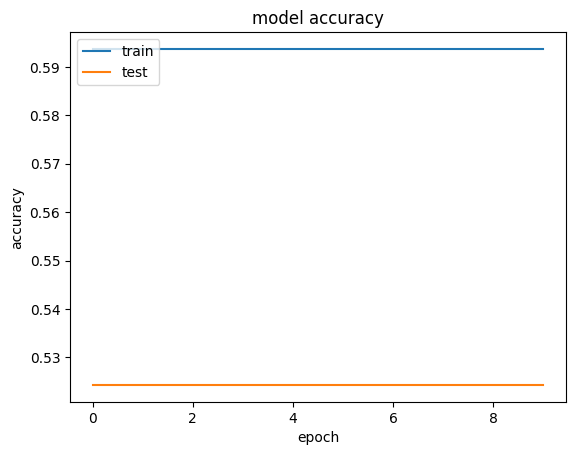

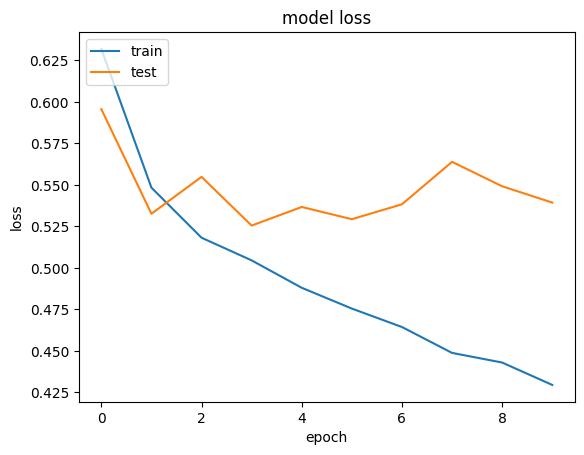

In [ ]:
print(dense_history.history.keys())
# summarize history for accuracy
plt.plot(dense_history.history['acc'])
plt.plot(dense_history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(dense_history.history['loss'])
plt.plot(dense_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# Own Model


In [ ]:
model = Sequential()

model.add(layers.Rescaling(1./255, input_shape=(img_height, img_width, num_channels)))

model.add(layers.Conv2D(256, (3, 3), activation='relu',))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu',))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(16, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Flatten())

model.add(layers.Dense(units = 128, activation = 'relu'))

model.add(layers.Dense(units = 64, activation = 'relu'))


model.add(layers.Dense(units = 16, activation = 'relu'))
model.add(layers.Dense(units = 1, activation = 'sigmoid'))

# Compiling the CNN
model.compile(optimizer = 'adam', 
                   loss = 'binary_crossentropy',
                   metrics = ['acc'])
print()
display(model.summary())




Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_13 (Rescaling)    (None, 200, 200, 3)       0         
                                                                 
 conv2d_71 (Conv2D)          (None, 198, 198, 256)     7168      
                                                                 
 max_pooling2d_67 (MaxPoolin  (None, 99, 99, 256)      0         
 g2D)                                                            
                                                                 
 conv2d_72 (Conv2D)          (None, 97, 97, 128)       295040    
                                                                 
 max_pooling2d_68 (MaxPoolin  (None, 48, 48, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_73 (Conv2D)          (None, 46, 46, 64)     

None

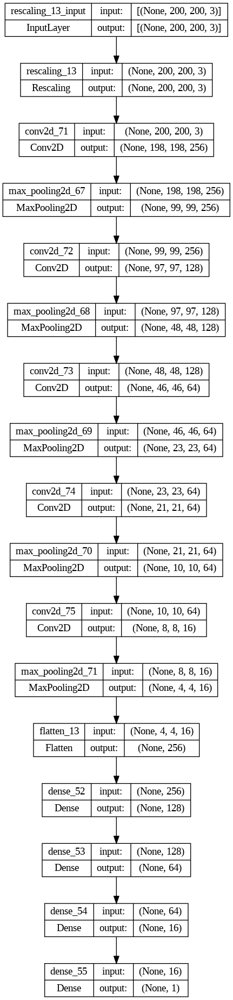

In [ ]:

tf.keras.utils.plot_model(model, show_shapes=True)

In [ ]:
history = model.fit(
  train_ds,
  validation_data=valid_ds,
  epochs=10
)

Epoch 1/10
686/686 [==============================] - 128s 180ms/step - loss: 0.6731 - acc: 0.5943 - val_loss: 0.7198 - val_acc: 0.5243
Epoch 2/10
686/686 [==============================] - 121s 175ms/step - loss: 0.6697 - acc: 0.5954 - val_loss: 0.7013 - val_acc: 0.5243
Epoch 3/10
686/686 [==============================] - 122s 177ms/step - loss: 0.6624 - acc: 0.6005 - val_loss: 0.7051 - val_acc: 0.5229
Epoch 4/10
686/686 [==============================] - 122s 177ms/step - loss: 0.6551 - acc: 0.6128 - val_loss: 0.7034 - val_acc: 0.5571
Epoch 5/10
686/686 [==============================] - 124s 179ms/step - loss: 0.6437 - acc: 0.6282 - val_loss: 0.6951 - val_acc: 0.5705
Epoch 6/10
686/686 [==============================] - 124s 180ms/step - loss: 0.6352 - acc: 0.6388 - val_loss: 0.6859 - val_acc: 0.5652
Epoch 7/10
686/686 [==============================] - 122s 175ms/step - loss: 0.6227 - acc: 0.6511 - val_loss: 0.6902 - val_acc: 0.5744
Epoch 8/10
686/686 [============================

In [ ]:
model.save("/content/drive/MyDrive/Spring/506-AI/COLAB/Project/MURA/saved_models/")

# Model Evaluation


In [ ]:
model = keras.models.load_model("/content/drive/MyDrive/Spring/506-AI/COLAB/Project/MURA/saved_models")
#model = keras.models.load_model("/content/drive/MyDrive/Spring/506-AI/COLAB/Project/MURA/dense_models_saves")
#history = dense_history

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 200, 200, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 198, 198, 256)     7168      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 99, 99, 256)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 97, 97, 128)       295040    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 48, 48, 128)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 46, 46, 64)       

In [ ]:
def evaluate_model(y_test, y_pred, model_history):
    """Takes in your target, target predictions, model history.
        Returns a metric report, confusion matrix and plots for 
        accuracy and loss."""
    
    ## Classification Report / Scores 
    print(metrics.classification_report(y_test,y_pred))

    # confusion matrix
    fig, ax = plt.subplots(figsize=(12,6))
    cm = metrics.confusion_matrix(y_test, y_pred, normalize='true')

    # Add title and axis labels
    plt.imshow(cm, interpolation='nearest', cmap='Blues' )
    plt.title('Confusion Matrix. 0=Abnormal, 1=Normal')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

    # Add appropriate axis scales
    class_names = set(y_test) # Get class labels to add to matrix
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names)
    plt.yticks(tick_marks, class_names)

    # Add labels to each cell
    thresh = cm.max() / 2. # Used for text coloring below
    # Here we iterate through the confusion matrix and append labels to our visualization 
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
            plt.text(j, i, round(cm[i, j], 2),
                    horizontalalignment='center',
                    color='white' if cm[i, j] > thresh else 'black')

    # classes = list(range(len(cm)))  
    # plt.xticks(classes, classes)
    # plt.yticks(classes, classes)

    plt.colorbar()
    plt.show()
    print(history.history.keys())
    # summarize history for accuracy
    plt.plot(history.history['acc'])
    plt.plot(history.history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

In [ ]:
# Create y_test and y_pred

valid_norm_dir_temp = "/content/valid_dir_temp/normal" 
valid_abnorm_dir_temp = "/content/valid_dir_temp/abnormal"

mis = []
y_test = []
y_pred = []
non_mis =[]
print("starting normal")


temp_valid_files_normal = glob.glob(valid_norm_dir_temp +'/*.png')
temp_valid_files_abnormal = glob.glob(valid_abnorm_dir_temp+'/*.png')


for neg in tqdm(temp_valid_files_normal):
  test_image = keras.utils.load_img(
      neg,
      color_mode=color_mode,
      target_size=(img_height , img_width),
      interpolation='nearest',
      keep_aspect_ratio=False
      )

  test_image = image.img_to_array(test_image)
  test_image = np.expand_dims(test_image, axis = 0)
  y_test.append(1)
  if model.predict(test_image) < 0.5:
    y_pred.append(0)
    mis.append(neg)
  else:
    y_pred.append(1)
    non_mis.append(neg)
  



print("starting abnormal")
for pos in tqdm(temp_valid_files_abnormal):
  test_image = keras.utils.load_img(
      pos,
      color_mode=color_mode,
      target_size=(img_height , img_width),
      interpolation='nearest',
      keep_aspect_ratio=False
      )

  test_image = image.img_to_array(test_image)
  test_image = np.expand_dims(test_image, axis = 0)
  y_test.append(0)
  if model.predict(test_image) > 0.5:
    y_pred.append(1)
    mis.append(pos)
  else:
    y_pred.append(0)
    non_mis.append(pos)
  


starting normal


  0%|          | 0/1089 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 2/1089 [00:00<01:28, 12.33it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 4/1089 [00:00<01:25, 12.62it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 6/1089 [00:00<01:24, 12.74it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 8/1089 [00:00<01:21, 13.21it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 10/1089 [00:00<01:21, 13.22it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 12/1089 [00:00<01:19, 13.61it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 14/1089 [00:01<01:21, 13.24it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 16/1089 [00:01<01:20, 13.27it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 18/1089 [00:01<01:19, 13.48it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 20/1089 [00:01<01:21, 13.11it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 22/1089 [00:01<01:36, 11.05it/s]

1/1 [==============================] - 0s 37ms/step


  2%|▏         | 24/1089 [00:02<01:46, 10.02it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 26/1089 [00:02<01:57,  9.05it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▏         | 27/1089 [00:02<01:57,  9.01it/s]

1/1 [==============================] - 0s 50ms/step


  3%|▎         | 28/1089 [00:02<02:03,  8.59it/s]

1/1 [==============================] - 0s 48ms/step


  3%|▎         | 29/1089 [00:02<02:08,  8.28it/s]

1/1 [==============================] - 0s 76ms/step


  3%|▎         | 30/1089 [00:02<02:36,  6.78it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 31/1089 [00:03<02:29,  7.06it/s]

1/1 [==============================] - 0s 55ms/step


  3%|▎         | 32/1089 [00:03<02:33,  6.90it/s]

1/1 [==============================] - 0s 112ms/step


  3%|▎         | 33/1089 [00:03<03:30,  5.01it/s]

1/1 [==============================] - 0s 108ms/step


  3%|▎         | 34/1089 [00:03<04:14,  4.14it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 35/1089 [00:04<03:43,  4.72it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 37/1089 [00:04<02:38,  6.63it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▎         | 39/1089 [00:04<02:11,  8.01it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 41/1089 [00:04<01:51,  9.40it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 43/1089 [00:04<01:37, 10.73it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 45/1089 [00:04<01:32, 11.33it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 47/1089 [00:04<01:26, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 49/1089 [00:05<01:23, 12.39it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 51/1089 [00:05<01:23, 12.45it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 53/1089 [00:05<01:21, 12.65it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 55/1089 [00:05<01:18, 13.25it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 57/1089 [00:05<01:19, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 59/1089 [00:05<01:19, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 61/1089 [00:05<01:18, 13.08it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 63/1089 [00:06<01:18, 13.10it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 65/1089 [00:06<01:16, 13.36it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 67/1089 [00:06<01:17, 13.23it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 69/1089 [00:06<01:16, 13.37it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 71/1089 [00:06<01:20, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 73/1089 [00:06<01:25, 11.95it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 75/1089 [00:07<01:32, 10.92it/s]

1/1 [==============================] - 0s 48ms/step


  7%|▋         | 77/1089 [00:07<01:42,  9.90it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 79/1089 [00:07<01:42,  9.82it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 81/1089 [00:07<01:43,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 82/1089 [00:07<01:43,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 83/1089 [00:08<01:45,  9.50it/s]

1/1 [==============================] - 0s 43ms/step


  8%|▊         | 84/1089 [00:08<01:47,  9.37it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 85/1089 [00:08<01:50,  9.07it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 86/1089 [00:08<01:50,  9.10it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 87/1089 [00:08<01:53,  8.81it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 88/1089 [00:08<01:52,  8.89it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 89/1089 [00:08<01:50,  9.04it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 90/1089 [00:08<01:48,  9.22it/s]

1/1 [==============================] - 0s 54ms/step


  8%|▊         | 91/1089 [00:08<01:53,  8.79it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 92/1089 [00:09<01:54,  8.72it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▊         | 94/1089 [00:09<01:49,  9.10it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▊         | 95/1089 [00:09<01:50,  9.02it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▉         | 96/1089 [00:09<01:54,  8.70it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 97/1089 [00:09<01:58,  8.40it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 98/1089 [00:09<01:54,  8.64it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 99/1089 [00:09<01:50,  8.97it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 100/1089 [00:09<01:48,  9.10it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 101/1089 [00:10<01:48,  9.09it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▉         | 103/1089 [00:10<01:46,  9.28it/s]

1/1 [==============================] - 0s 34ms/step


 10%|▉         | 104/1089 [00:10<01:46,  9.29it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 106/1089 [00:10<01:45,  9.29it/s]

1/1 [==============================] - 0s 42ms/step


 10%|▉         | 108/1089 [00:10<01:46,  9.22it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 110/1089 [00:10<01:37, 10.05it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 112/1089 [00:11<01:29, 10.96it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 114/1089 [00:11<01:25, 11.34it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 116/1089 [00:11<01:21, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 118/1089 [00:11<01:19, 12.28it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 120/1089 [00:11<01:18, 12.30it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 122/1089 [00:11<01:17, 12.55it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 124/1089 [00:12<01:14, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 126/1089 [00:12<01:13, 13.08it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 128/1089 [00:12<01:11, 13.49it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 130/1089 [00:12<01:10, 13.65it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 132/1089 [00:12<01:11, 13.42it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 134/1089 [00:12<01:11, 13.43it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 136/1089 [00:12<01:13, 13.01it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 138/1089 [00:13<01:14, 12.80it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 140/1089 [00:13<01:13, 12.93it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 142/1089 [00:13<01:11, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 144/1089 [00:13<01:10, 13.48it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 146/1089 [00:13<01:11, 13.17it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 148/1089 [00:13<01:13, 12.81it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 150/1089 [00:14<01:12, 12.95it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 152/1089 [00:14<01:12, 12.93it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 154/1089 [00:14<01:10, 13.31it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 156/1089 [00:14<01:09, 13.50it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 158/1089 [00:14<01:07, 13.74it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 160/1089 [00:14<01:09, 13.36it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 162/1089 [00:14<01:08, 13.61it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 164/1089 [00:15<01:09, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 166/1089 [00:15<01:11, 12.83it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 168/1089 [00:15<01:11, 12.85it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 170/1089 [00:15<01:09, 13.28it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 172/1089 [00:15<01:10, 13.00it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 174/1089 [00:15<01:10, 13.01it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 176/1089 [00:15<01:09, 13.14it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 178/1089 [00:16<01:08, 13.23it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 180/1089 [00:16<01:08, 13.22it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 182/1089 [00:16<01:07, 13.49it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 184/1089 [00:16<01:07, 13.40it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 186/1089 [00:16<01:08, 13.21it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 188/1089 [00:16<01:07, 13.31it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 190/1089 [00:17<01:08, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 192/1089 [00:17<01:09, 13.00it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 194/1089 [00:17<01:10, 12.63it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 196/1089 [00:17<01:09, 12.79it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 198/1089 [00:17<01:09, 12.76it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 200/1089 [00:17<01:09, 12.83it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 202/1089 [00:17<01:09, 12.74it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 204/1089 [00:18<01:08, 12.86it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 206/1089 [00:18<01:12, 12.15it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 208/1089 [00:18<01:17, 11.30it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 210/1089 [00:18<01:27, 10.07it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▉        | 212/1089 [00:19<01:30,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 214/1089 [00:19<01:32,  9.48it/s]

1/1 [==============================] - 0s 35ms/step


 20%|█▉        | 216/1089 [00:19<01:28,  9.82it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 218/1089 [00:19<01:30,  9.62it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 219/1089 [00:19<01:32,  9.36it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 220/1089 [00:19<01:33,  9.31it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 221/1089 [00:19<01:34,  9.16it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 222/1089 [00:20<01:34,  9.14it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 223/1089 [00:20<01:33,  9.23it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 224/1089 [00:20<01:33,  9.29it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 226/1089 [00:20<01:32,  9.34it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 227/1089 [00:20<01:32,  9.35it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 228/1089 [00:20<01:32,  9.35it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██        | 229/1089 [00:20<01:32,  9.31it/s]

1/1 [==============================] - 0s 47ms/step


 21%|██        | 230/1089 [00:20<01:36,  8.89it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 231/1089 [00:21<01:36,  8.88it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██▏       | 232/1089 [00:21<01:39,  8.62it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██▏       | 233/1089 [00:21<01:42,  8.38it/s]

1/1 [==============================] - 0s 68ms/step


 21%|██▏       | 234/1089 [00:21<01:53,  7.53it/s]

1/1 [==============================] - 0s 62ms/step


 22%|██▏       | 235/1089 [00:21<01:57,  7.27it/s]

1/1 [==============================] - 0s 72ms/step


 22%|██▏       | 236/1089 [00:21<02:02,  6.98it/s]

1/1 [==============================] - 0s 53ms/step


 22%|██▏       | 237/1089 [00:21<02:05,  6.77it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 238/1089 [00:22<01:59,  7.09it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██▏       | 239/1089 [00:22<01:59,  7.10it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██▏       | 240/1089 [00:22<02:00,  7.03it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 241/1089 [00:22<01:50,  7.71it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 242/1089 [00:22<01:46,  7.99it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 243/1089 [00:22<01:49,  7.74it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██▏       | 244/1089 [00:22<01:45,  8.03it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 245/1089 [00:22<01:45,  8.02it/s]

1/1 [==============================] - 0s 46ms/step


 23%|██▎       | 246/1089 [00:23<01:52,  7.51it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██▎       | 247/1089 [00:23<01:52,  7.51it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 248/1089 [00:23<01:51,  7.55it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██▎       | 249/1089 [00:23<01:49,  7.64it/s]

1/1 [==============================] - 0s 49ms/step


 23%|██▎       | 250/1089 [00:23<01:48,  7.75it/s]

1/1 [==============================] - 0s 46ms/step


 23%|██▎       | 251/1089 [00:23<01:50,  7.57it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 252/1089 [00:23<01:45,  7.93it/s]

1/1 [==============================] - 0s 76ms/step


 23%|██▎       | 253/1089 [00:24<01:54,  7.31it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 254/1089 [00:24<01:52,  7.43it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 255/1089 [00:24<01:52,  7.41it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 256/1089 [00:24<01:45,  7.90it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 257/1089 [00:24<01:40,  8.28it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 258/1089 [00:24<01:37,  8.52it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 259/1089 [00:24<01:35,  8.69it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 260/1089 [00:24<01:33,  8.84it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 261/1089 [00:24<01:32,  8.93it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 262/1089 [00:25<01:31,  9.08it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 263/1089 [00:25<01:34,  8.70it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 264/1089 [00:25<01:39,  8.33it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 265/1089 [00:25<01:35,  8.64it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██▍       | 266/1089 [00:25<01:32,  8.88it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 267/1089 [00:25<01:33,  8.79it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 268/1089 [00:25<01:30,  9.08it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 269/1089 [00:25<01:28,  9.22it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 271/1089 [00:26<01:22,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 272/1089 [00:26<01:26,  9.50it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 273/1089 [00:26<01:29,  9.16it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 274/1089 [00:26<01:32,  8.79it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 275/1089 [00:26<01:34,  8.64it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▌       | 276/1089 [00:26<01:32,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 278/1089 [00:26<01:23,  9.76it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 280/1089 [00:26<01:13, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 282/1089 [00:27<01:12, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 284/1089 [00:27<01:13, 11.02it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 286/1089 [00:27<01:11, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 288/1089 [00:27<01:09, 11.56it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 290/1089 [00:27<01:08, 11.69it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 292/1089 [00:27<01:05, 12.13it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 294/1089 [00:28<01:03, 12.60it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 296/1089 [00:28<01:02, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 298/1089 [00:28<01:02, 12.65it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 300/1089 [00:28<01:04, 12.33it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 302/1089 [00:28<01:03, 12.38it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 304/1089 [00:28<01:01, 12.82it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 306/1089 [00:29<01:01, 12.79it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 308/1089 [00:29<01:01, 12.79it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 310/1089 [00:29<01:03, 12.35it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 312/1089 [00:29<01:02, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 314/1089 [00:29<01:02, 12.45it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 316/1089 [00:29<01:01, 12.50it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 318/1089 [00:30<01:03, 12.12it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 320/1089 [00:30<01:01, 12.54it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 322/1089 [00:30<01:00, 12.64it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 324/1089 [00:30<01:00, 12.74it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 326/1089 [00:30<01:00, 12.53it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 328/1089 [00:30<01:01, 12.36it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 330/1089 [00:30<01:01, 12.28it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 332/1089 [00:31<01:00, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 334/1089 [00:31<00:58, 12.85it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 336/1089 [00:31<01:00, 12.55it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 338/1089 [00:31<00:58, 12.91it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 340/1089 [00:31<00:57, 13.06it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 342/1089 [00:31<00:57, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 344/1089 [00:32<00:58, 12.75it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 346/1089 [00:32<00:58, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 348/1089 [00:32<00:59, 12.43it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 350/1089 [00:32<00:58, 12.54it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 352/1089 [00:32<00:58, 12.56it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 354/1089 [00:32<00:59, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 356/1089 [00:33<01:00, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 358/1089 [00:33<01:00, 12.09it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 360/1089 [00:33<01:00, 12.13it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 362/1089 [00:33<00:59, 12.29it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 364/1089 [00:33<00:58, 12.50it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 366/1089 [00:33<00:58, 12.46it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 368/1089 [00:34<00:57, 12.64it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 370/1089 [00:34<00:58, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 372/1089 [00:34<00:59, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 374/1089 [00:34<01:03, 11.35it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 376/1089 [00:34<01:02, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 378/1089 [00:34<01:00, 11.75it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 380/1089 [00:35<01:00, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 382/1089 [00:35<00:59, 11.81it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 384/1089 [00:35<00:58, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 386/1089 [00:35<00:59, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 388/1089 [00:35<00:58, 11.99it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 390/1089 [00:35<00:57, 12.14it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 392/1089 [00:36<00:57, 12.12it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 394/1089 [00:36<00:55, 12.48it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 396/1089 [00:36<00:55, 12.46it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 398/1089 [00:36<00:57, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 400/1089 [00:36<00:58, 11.72it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 402/1089 [00:36<01:03, 10.82it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 404/1089 [00:37<01:06, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 406/1089 [00:37<01:09,  9.80it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 407/1089 [00:37<01:09,  9.75it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 408/1089 [00:37<01:11,  9.48it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 409/1089 [00:37<01:13,  9.25it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 410/1089 [00:37<01:16,  8.86it/s]

1/1 [==============================] - 0s 49ms/step


 38%|███▊      | 411/1089 [00:37<01:16,  8.83it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 413/1089 [00:38<01:14,  9.12it/s]

1/1 [==============================] - 0s 44ms/step


 38%|███▊      | 414/1089 [00:38<01:14,  9.08it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 415/1089 [00:38<01:15,  8.87it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 416/1089 [00:38<01:14,  8.98it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 417/1089 [00:38<01:17,  8.71it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 418/1089 [00:38<01:17,  8.62it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 419/1089 [00:38<01:17,  8.65it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 420/1089 [00:38<01:19,  8.43it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 421/1089 [00:39<01:17,  8.57it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 423/1089 [00:39<01:14,  9.00it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 424/1089 [00:39<01:13,  9.11it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 425/1089 [00:39<01:13,  9.03it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 426/1089 [00:39<01:14,  8.96it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▉      | 427/1089 [00:39<01:15,  8.78it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 428/1089 [00:39<01:15,  8.74it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 429/1089 [00:39<01:14,  8.84it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 430/1089 [00:40<01:13,  8.96it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 431/1089 [00:40<01:12,  9.11it/s]

1/1 [==============================] - 0s 44ms/step


 40%|███▉      | 432/1089 [00:40<01:15,  8.66it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 433/1089 [00:40<01:13,  8.94it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 435/1089 [00:40<01:10,  9.31it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 436/1089 [00:40<01:11,  9.15it/s]

1/1 [==============================] - 0s 41ms/step


 40%|████      | 437/1089 [00:40<01:10,  9.24it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 438/1089 [00:40<01:10,  9.20it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 439/1089 [00:41<01:12,  9.03it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 440/1089 [00:41<01:13,  8.88it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 441/1089 [00:41<01:14,  8.70it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 442/1089 [00:41<01:13,  8.77it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 443/1089 [00:41<01:11,  9.07it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 445/1089 [00:41<01:00, 10.57it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 447/1089 [00:41<00:58, 11.07it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 449/1089 [00:42<00:56, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 451/1089 [00:42<00:56, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 453/1089 [00:42<00:54, 11.62it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 455/1089 [00:42<00:53, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 457/1089 [00:42<00:52, 12.07it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 459/1089 [00:42<00:53, 11.69it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 461/1089 [00:43<00:51, 12.09it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 463/1089 [00:43<00:51, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 465/1089 [00:43<00:51, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 467/1089 [00:43<00:52, 11.84it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 469/1089 [00:43<00:53, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 471/1089 [00:43<00:53, 11.57it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 473/1089 [00:44<00:52, 11.84it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 475/1089 [00:44<00:51, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 477/1089 [00:44<00:51, 11.84it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 479/1089 [00:44<00:51, 11.81it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 481/1089 [00:44<00:50, 12.01it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 483/1089 [00:44<00:49, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 485/1089 [00:45<00:51, 11.84it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 487/1089 [00:45<00:50, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 489/1089 [00:45<00:49, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 491/1089 [00:45<00:50, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 493/1089 [00:45<00:49, 12.05it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 495/1089 [00:45<00:50, 11.66it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 497/1089 [00:46<00:50, 11.83it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 499/1089 [00:46<00:49, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 501/1089 [00:46<00:47, 12.25it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 503/1089 [00:46<00:46, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 505/1089 [00:46<00:47, 12.37it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 507/1089 [00:46<00:47, 12.25it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 509/1089 [00:47<00:47, 12.32it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 511/1089 [00:47<00:46, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 513/1089 [00:47<00:46, 12.40it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 515/1089 [00:47<00:46, 12.37it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 517/1089 [00:47<00:46, 12.32it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 519/1089 [00:47<00:45, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 521/1089 [00:48<00:48, 11.71it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 523/1089 [00:48<00:47, 11.86it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 525/1089 [00:48<00:46, 12.11it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 527/1089 [00:48<00:45, 12.42it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 529/1089 [00:48<00:46, 11.98it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 531/1089 [00:48<00:46, 12.10it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 533/1089 [00:49<00:46, 11.99it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 535/1089 [00:49<00:46, 11.87it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 537/1089 [00:49<00:45, 12.05it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 539/1089 [00:49<00:45, 11.98it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 541/1089 [00:49<00:45, 12.02it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 543/1089 [00:49<00:44, 12.16it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 545/1089 [00:50<00:45, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 547/1089 [00:50<00:46, 11.59it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 549/1089 [00:50<00:45, 11.92it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 551/1089 [00:50<00:45, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 553/1089 [00:50<00:45, 11.79it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 555/1089 [00:50<00:44, 12.09it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 557/1089 [00:51<01:21,  6.53it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████     | 558/1089 [00:51<01:18,  6.72it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████▏    | 559/1089 [00:51<01:17,  6.84it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████▏    | 560/1089 [00:51<01:15,  7.02it/s]

1/1 [==============================] - 0s 49ms/step


 52%|█████▏    | 561/1089 [00:52<01:14,  7.09it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 562/1089 [00:52<01:11,  7.33it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 563/1089 [00:52<01:09,  7.58it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 564/1089 [00:52<01:10,  7.49it/s]

1/1 [==============================] - 0s 49ms/step


 52%|█████▏    | 565/1089 [00:52<01:12,  7.25it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 566/1089 [00:52<01:08,  7.68it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 567/1089 [00:52<01:04,  8.07it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 568/1089 [00:52<01:04,  8.12it/s]

1/1 [==============================] - 0s 62ms/step


 52%|█████▏    | 569/1089 [00:53<01:06,  7.78it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 570/1089 [00:53<01:05,  7.88it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 571/1089 [00:53<01:05,  7.97it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 572/1089 [00:53<01:04,  7.97it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 573/1089 [00:53<01:03,  8.14it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 574/1089 [00:53<01:08,  7.54it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 575/1089 [00:53<01:06,  7.70it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 576/1089 [00:53<01:08,  7.53it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 577/1089 [00:54<01:08,  7.53it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 578/1089 [00:54<01:06,  7.70it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 579/1089 [00:54<01:05,  7.75it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 580/1089 [00:54<01:05,  7.79it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 581/1089 [00:54<01:02,  8.06it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 582/1089 [00:54<01:07,  7.50it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 583/1089 [00:54<01:08,  7.38it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 584/1089 [00:54<01:06,  7.58it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▎    | 585/1089 [00:55<01:05,  7.70it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 586/1089 [00:55<01:03,  7.91it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 587/1089 [00:55<01:02,  8.02it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 588/1089 [00:55<01:01,  8.21it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 589/1089 [00:55<01:01,  8.16it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 590/1089 [00:55<01:02,  8.00it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 591/1089 [00:55<01:03,  7.84it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 592/1089 [00:55<01:05,  7.54it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 593/1089 [00:56<01:04,  7.70it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 594/1089 [00:56<01:04,  7.69it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 596/1089 [00:56<00:54,  9.11it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 598/1089 [00:56<00:49,  9.88it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 600/1089 [00:56<00:47, 10.27it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 602/1089 [00:56<00:49,  9.85it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 603/1089 [00:57<00:49,  9.84it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 605/1089 [00:57<00:47, 10.09it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 607/1089 [00:57<00:46, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 609/1089 [00:57<00:45, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 611/1089 [00:57<00:45, 10.55it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 613/1089 [00:58<00:45, 10.40it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 615/1089 [00:58<00:45, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 617/1089 [00:58<00:44, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 619/1089 [00:58<00:44, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 621/1089 [00:58<00:43, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 623/1089 [00:58<00:42, 11.03it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 625/1089 [00:59<00:42, 10.89it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 627/1089 [00:59<00:43, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 629/1089 [00:59<00:44, 10.35it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 631/1089 [00:59<00:44, 10.33it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 633/1089 [00:59<00:43, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 635/1089 [01:00<00:43, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 637/1089 [01:00<00:44, 10.24it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▊    | 639/1089 [01:00<00:43, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 641/1089 [01:00<00:43, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 643/1089 [01:00<00:42, 10.57it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 645/1089 [01:01<00:41, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 647/1089 [01:01<00:41, 10.68it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 649/1089 [01:01<00:41, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 651/1089 [01:01<00:40, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 653/1089 [01:01<00:40, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 655/1089 [01:01<00:40, 10.78it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 657/1089 [01:02<00:39, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 659/1089 [01:02<00:37, 11.43it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 661/1089 [01:02<00:36, 11.77it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 663/1089 [01:02<00:38, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 665/1089 [01:02<00:38, 11.05it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 667/1089 [01:03<00:37, 11.27it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████▏   | 669/1089 [01:03<00:36, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 671/1089 [01:03<00:35, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 673/1089 [01:03<00:36, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 675/1089 [01:03<00:35, 11.55it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 677/1089 [01:03<00:35, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 679/1089 [01:04<00:35, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 681/1089 [01:04<00:34, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 683/1089 [01:04<00:34, 11.87it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 685/1089 [01:04<00:34, 11.70it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 687/1089 [01:04<00:33, 11.96it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 689/1089 [01:04<00:34, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 691/1089 [01:05<00:34, 11.61it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 693/1089 [01:05<00:33, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 695/1089 [01:05<00:32, 12.06it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 697/1089 [01:05<00:31, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 699/1089 [01:05<00:32, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 701/1089 [01:05<00:31, 12.33it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 703/1089 [01:06<00:31, 12.34it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 705/1089 [01:06<00:31, 12.24it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 707/1089 [01:06<00:34, 11.06it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 709/1089 [01:06<00:36, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 711/1089 [01:06<00:37,  9.96it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▌   | 713/1089 [01:07<00:39,  9.51it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 714/1089 [01:07<00:40,  9.34it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 715/1089 [01:07<00:40,  9.31it/s]

1/1 [==============================] - 0s 51ms/step


 66%|██████▌   | 716/1089 [01:07<00:44,  8.46it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 717/1089 [01:07<00:44,  8.41it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 718/1089 [01:07<00:43,  8.62it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 720/1089 [01:07<00:39,  9.25it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 721/1089 [01:08<00:40,  9.08it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▋   | 722/1089 [01:08<00:40,  9.13it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▋   | 723/1089 [01:08<00:39,  9.23it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 724/1089 [01:08<00:41,  8.87it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 725/1089 [01:08<00:44,  8.26it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 726/1089 [01:08<00:44,  8.18it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 727/1089 [01:08<00:43,  8.31it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 729/1089 [01:08<00:38,  9.37it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 730/1089 [01:09<00:38,  9.36it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 731/1089 [01:09<00:37,  9.43it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 732/1089 [01:09<00:37,  9.41it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 733/1089 [01:09<00:38,  9.23it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 734/1089 [01:09<00:38,  9.22it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 735/1089 [01:09<00:37,  9.39it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 736/1089 [01:09<00:38,  9.24it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 738/1089 [01:09<00:36,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 740/1089 [01:10<00:35,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 741/1089 [01:10<00:35,  9.86it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 742/1089 [01:10<00:37,  9.20it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 743/1089 [01:10<00:39,  8.85it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 744/1089 [01:10<00:40,  8.58it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 745/1089 [01:10<00:40,  8.52it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▊   | 746/1089 [01:10<00:39,  8.68it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 747/1089 [01:10<00:39,  8.60it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 748/1089 [01:11<00:38,  8.83it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▉   | 749/1089 [01:11<00:38,  8.83it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 750/1089 [01:11<00:38,  8.91it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 751/1089 [01:11<00:38,  8.68it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▉   | 752/1089 [01:11<00:40,  8.31it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 753/1089 [01:11<00:39,  8.56it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 755/1089 [01:11<00:35,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 757/1089 [01:11<00:32, 10.23it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 759/1089 [01:12<00:30, 10.79it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 761/1089 [01:12<00:29, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 763/1089 [01:12<00:28, 11.42it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 765/1089 [01:12<00:27, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 767/1089 [01:12<00:28, 11.33it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 769/1089 [01:12<00:28, 11.32it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 771/1089 [01:13<00:28, 11.21it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 773/1089 [01:13<00:27, 11.47it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 775/1089 [01:13<00:27, 11.61it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 777/1089 [01:13<00:26, 11.59it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 779/1089 [01:13<00:27, 11.48it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 781/1089 [01:14<00:26, 11.49it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 783/1089 [01:14<00:26, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 785/1089 [01:14<00:26, 11.68it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 787/1089 [01:14<00:26, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 789/1089 [01:14<00:26, 11.39it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 791/1089 [01:14<00:25, 11.47it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 793/1089 [01:15<00:25, 11.59it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 795/1089 [01:15<00:25, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 797/1089 [01:15<00:26, 11.21it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 799/1089 [01:15<00:25, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 801/1089 [01:15<00:24, 11.53it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 803/1089 [01:15<00:24, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 805/1089 [01:16<00:24, 11.61it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 807/1089 [01:16<00:24, 11.29it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 809/1089 [01:16<00:24, 11.50it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 811/1089 [01:16<00:24, 11.38it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 813/1089 [01:16<00:23, 11.98it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 815/1089 [01:16<00:23, 11.70it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 817/1089 [01:17<00:23, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 819/1089 [01:17<00:23, 11.69it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 821/1089 [01:17<00:22, 11.66it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 823/1089 [01:17<00:23, 11.43it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 825/1089 [01:17<00:22, 11.69it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 827/1089 [01:17<00:22, 11.72it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 829/1089 [01:18<00:21, 11.93it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▋  | 831/1089 [01:18<00:21, 11.86it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 833/1089 [01:18<00:21, 11.86it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 835/1089 [01:18<00:21, 11.90it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 837/1089 [01:18<00:21, 11.78it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 839/1089 [01:18<00:21, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 841/1089 [01:19<00:21, 11.59it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 843/1089 [01:19<00:20, 11.80it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 845/1089 [01:19<00:20, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 847/1089 [01:19<00:20, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 849/1089 [01:19<00:20, 11.74it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 851/1089 [01:20<00:20, 11.86it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 853/1089 [01:20<00:19, 12.02it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 855/1089 [01:20<00:19, 12.21it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 857/1089 [01:20<00:18, 12.25it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 859/1089 [01:20<00:18, 12.18it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 861/1089 [01:20<00:19, 11.97it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 863/1089 [01:20<00:18, 12.09it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 865/1089 [01:21<00:18, 12.16it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 867/1089 [01:21<00:18, 12.30it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 869/1089 [01:21<00:17, 12.52it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 871/1089 [01:21<00:18, 11.78it/s]

1/1 [==============================] - 0s 49ms/step


 80%|████████  | 873/1089 [01:21<00:20, 10.54it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 875/1089 [01:22<00:22,  9.72it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 877/1089 [01:22<00:22,  9.24it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 879/1089 [01:22<00:22,  9.46it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 881/1089 [01:22<00:21,  9.81it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 883/1089 [01:22<00:20,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 885/1089 [01:23<00:21,  9.34it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████▏ | 886/1089 [01:23<00:22,  8.97it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 887/1089 [01:23<00:22,  8.96it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 888/1089 [01:23<00:22,  8.94it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 889/1089 [01:23<00:22,  9.01it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 890/1089 [01:23<00:22,  9.01it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 891/1089 [01:23<00:21,  9.17it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 892/1089 [01:23<00:21,  9.22it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 893/1089 [01:24<00:20,  9.40it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 894/1089 [01:24<00:22,  8.66it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 895/1089 [01:24<00:23,  8.42it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 896/1089 [01:24<00:23,  8.12it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 897/1089 [01:24<00:22,  8.39it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 898/1089 [01:24<00:22,  8.54it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 899/1089 [01:24<00:22,  8.62it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 900/1089 [01:24<00:22,  8.58it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 901/1089 [01:25<00:22,  8.37it/s]

1/1 [==============================] - 0s 55ms/step


 83%|████████▎ | 902/1089 [01:25<00:22,  8.18it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 903/1089 [01:25<00:23,  8.04it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 904/1089 [01:25<00:22,  8.05it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 905/1089 [01:25<00:22,  8.29it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 906/1089 [01:25<00:21,  8.36it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 907/1089 [01:25<00:21,  8.57it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 908/1089 [01:25<00:21,  8.46it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 909/1089 [01:26<00:20,  8.76it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 910/1089 [01:26<00:21,  8.36it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▎ | 911/1089 [01:26<00:21,  8.26it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▎ | 912/1089 [01:26<00:22,  7.86it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 913/1089 [01:26<00:21,  8.05it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 914/1089 [01:26<00:21,  8.21it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 915/1089 [01:26<00:21,  8.09it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 916/1089 [01:26<00:20,  8.43it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 917/1089 [01:27<00:20,  8.23it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 918/1089 [01:27<00:20,  8.35it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 919/1089 [01:27<00:20,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 921/1089 [01:27<00:17,  9.57it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 923/1089 [01:27<00:15, 10.38it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▍ | 925/1089 [01:27<00:15, 10.59it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 927/1089 [01:27<00:14, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 929/1089 [01:28<00:14, 11.03it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 931/1089 [01:28<00:14, 11.22it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 933/1089 [01:28<00:14, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 935/1089 [01:28<00:13, 11.24it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 937/1089 [01:28<00:13, 11.25it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 939/1089 [01:29<00:13, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 941/1089 [01:29<00:13, 11.25it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 943/1089 [01:29<00:13, 11.12it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 945/1089 [01:29<00:12, 11.47it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 947/1089 [01:29<00:12, 11.01it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 949/1089 [01:29<00:12, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 951/1089 [01:30<00:12, 11.24it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 953/1089 [01:30<00:11, 11.42it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 955/1089 [01:30<00:11, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 957/1089 [01:30<00:11, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 959/1089 [01:30<00:11, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 961/1089 [01:30<00:10, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 963/1089 [01:31<00:10, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 965/1089 [01:31<00:11, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 967/1089 [01:31<00:10, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 969/1089 [01:31<00:10, 11.40it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 971/1089 [01:31<00:10, 11.36it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 973/1089 [01:31<00:10, 11.48it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 975/1089 [01:32<00:10, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 977/1089 [01:32<00:10, 11.03it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 979/1089 [01:32<00:10, 10.90it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 981/1089 [01:32<00:10, 10.69it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 983/1089 [01:32<00:09, 10.92it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 985/1089 [01:33<00:09, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 987/1089 [01:33<00:08, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 989/1089 [01:33<00:08, 11.34it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 991/1089 [01:33<00:08, 11.05it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 993/1089 [01:33<00:08, 11.15it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 995/1089 [01:33<00:08, 11.32it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 997/1089 [01:34<00:08, 11.49it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 999/1089 [01:34<00:07, 11.62it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 1001/1089 [01:34<00:07, 11.37it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1003/1089 [01:34<00:07, 11.06it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1005/1089 [01:34<00:07, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1007/1089 [01:35<00:07, 11.41it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1009/1089 [01:35<00:07, 11.39it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1011/1089 [01:35<00:06, 11.39it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1013/1089 [01:35<00:06, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1015/1089 [01:35<00:06, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1017/1089 [01:35<00:06, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 1019/1089 [01:36<00:06, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1021/1089 [01:36<00:06, 11.31it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1023/1089 [01:36<00:05, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1025/1089 [01:36<00:05, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1027/1089 [01:36<00:05, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1029/1089 [01:36<00:05, 11.34it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1031/1089 [01:37<00:05, 10.73it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 1033/1089 [01:37<00:05, 10.39it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 1035/1089 [01:37<00:05,  9.52it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 1036/1089 [01:37<00:05,  9.11it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 1037/1089 [01:37<00:05,  8.86it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 1038/1089 [01:38<00:05,  8.71it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 1039/1089 [01:38<00:05,  8.53it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 1040/1089 [01:38<00:06,  7.99it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 1041/1089 [01:38<00:05,  8.11it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 1042/1089 [01:38<00:05,  8.35it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 1043/1089 [01:38<00:05,  8.24it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 1044/1089 [01:38<00:05,  8.44it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 1045/1089 [01:38<00:05,  8.71it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 1046/1089 [01:38<00:04,  9.01it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 1047/1089 [01:39<00:04,  8.44it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 1048/1089 [01:39<00:04,  8.60it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▋| 1049/1089 [01:39<00:04,  8.51it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 1050/1089 [01:39<00:04,  8.23it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 1051/1089 [01:39<00:04,  8.11it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 1052/1089 [01:39<00:04,  8.09it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 1053/1089 [01:39<00:04,  8.36it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 1054/1089 [01:39<00:04,  8.51it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 1055/1089 [01:40<00:03,  8.79it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 1056/1089 [01:40<00:03,  9.04it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 1058/1089 [01:40<00:03,  9.43it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 1059/1089 [01:40<00:03,  9.51it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 1061/1089 [01:40<00:02,  9.48it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 1062/1089 [01:40<00:02,  9.48it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 1063/1089 [01:40<00:02,  9.05it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 1064/1089 [01:41<00:02,  8.86it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 1065/1089 [01:41<00:02,  8.89it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 1066/1089 [01:41<00:02,  9.16it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 1067/1089 [01:41<00:02,  9.31it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 1068/1089 [01:41<00:02,  9.22it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 1069/1089 [01:41<00:02,  9.13it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 1070/1089 [01:41<00:02,  8.71it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 1071/1089 [01:41<00:02,  8.43it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 1072/1089 [01:41<00:02,  8.49it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 1073/1089 [01:42<00:01,  8.41it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 1074/1089 [01:42<00:01,  8.37it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 1075/1089 [01:42<00:01,  8.31it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 1076/1089 [01:42<00:01,  8.06it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 1077/1089 [01:42<00:01,  8.21it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 1078/1089 [01:42<00:01,  8.29it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 1079/1089 [01:42<00:01,  8.08it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 1080/1089 [01:42<00:01,  7.84it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 1081/1089 [01:43<00:00,  8.38it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 1082/1089 [01:43<00:00,  8.62it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 1083/1089 [01:43<00:00,  8.55it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 1084/1089 [01:43<00:00,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 1085/1089 [01:43<00:00,  8.58it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 1086/1089 [01:43<00:00,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 1088/1089 [01:43<00:00,  9.93it/s]

1/1 [==============================] - 0s 25ms/step


100%|██████████| 1089/1089 [01:43<00:00, 10.48it/s]


starting abnormal


  0%|          | 0/988 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 1/988 [00:00<01:48,  9.08it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 3/988 [00:00<01:32, 10.66it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 5/988 [00:00<01:23, 11.75it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 7/988 [00:00<01:21, 11.99it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 9/988 [00:00<01:23, 11.66it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 11/988 [00:00<01:23, 11.67it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 13/988 [00:01<01:25, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 15/988 [00:01<01:24, 11.55it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 17/988 [00:01<01:23, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 19/988 [00:01<01:24, 11.43it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 21/988 [00:01<01:26, 11.24it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 23/988 [00:02<01:24, 11.39it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 25/988 [00:02<01:24, 11.41it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 27/988 [00:02<01:23, 11.47it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 29/988 [00:02<01:21, 11.71it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 31/988 [00:02<01:20, 11.87it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 33/988 [00:02<01:19, 11.97it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▎         | 35/988 [00:03<01:20, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 37/988 [00:03<01:22, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 39/988 [00:03<01:22, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 41/988 [00:03<01:22, 11.48it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 43/988 [00:03<01:21, 11.54it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 45/988 [00:03<01:22, 11.39it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 47/988 [00:04<01:24, 11.16it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 49/988 [00:04<01:23, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 51/988 [00:04<01:21, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 53/988 [00:04<01:22, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 55/988 [00:04<01:21, 11.38it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 57/988 [00:04<01:20, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 59/988 [00:05<01:21, 11.39it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 61/988 [00:05<01:17, 11.89it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 63/988 [00:05<01:20, 11.52it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 65/988 [00:05<01:21, 11.36it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 67/988 [00:05<01:20, 11.45it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 69/988 [00:05<01:19, 11.61it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 71/988 [00:06<01:19, 11.57it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 73/988 [00:06<01:19, 11.48it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 75/988 [00:06<01:18, 11.66it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 77/988 [00:06<01:18, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 79/988 [00:06<01:19, 11.45it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 81/988 [00:07<01:18, 11.58it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 83/988 [00:07<01:19, 11.32it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 85/988 [00:07<01:17, 11.71it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 87/988 [00:07<01:16, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 89/988 [00:07<01:18, 11.50it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 91/988 [00:07<01:18, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 93/988 [00:08<01:18, 11.38it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 95/988 [00:08<01:16, 11.63it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 97/988 [00:08<01:15, 11.73it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 99/988 [00:08<01:14, 11.94it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 101/988 [00:08<01:14, 11.85it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 103/988 [00:08<01:15, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 105/988 [00:09<01:16, 11.55it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 107/988 [00:09<01:18, 11.18it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 109/988 [00:09<01:16, 11.56it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 111/988 [00:09<01:17, 11.33it/s]

1/1 [==============================] - 0s 53ms/step


 11%|█▏        | 113/988 [00:09<01:26, 10.08it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 115/988 [00:10<01:30,  9.70it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 116/988 [00:10<01:35,  9.17it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 117/988 [00:10<01:36,  9.04it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 119/988 [00:10<01:31,  9.51it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 120/988 [00:10<01:32,  9.36it/s]

1/1 [==============================] - 0s 44ms/step


 12%|█▏        | 121/988 [00:10<01:35,  9.04it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 123/988 [00:11<01:35,  9.10it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 124/988 [00:11<01:37,  8.85it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 125/988 [00:11<01:44,  8.22it/s]

1/1 [==============================] - 0s 43ms/step


 13%|█▎        | 126/988 [00:11<01:48,  7.97it/s]

1/1 [==============================] - 0s 46ms/step


 13%|█▎        | 127/988 [00:11<01:48,  7.93it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 128/988 [00:11<01:48,  7.93it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 129/988 [00:11<01:42,  8.38it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 130/988 [00:11<01:38,  8.70it/s]

1/1 [==============================] - 0s 40ms/step


 13%|█▎        | 131/988 [00:11<01:35,  8.94it/s]

1/1 [==============================] - 0s 43ms/step


 13%|█▎        | 132/988 [00:12<01:39,  8.62it/s]

1/1 [==============================] - 0s 45ms/step


 13%|█▎        | 133/988 [00:12<01:41,  8.44it/s]

1/1 [==============================] - 0s 50ms/step


 14%|█▎        | 134/988 [00:12<01:45,  8.06it/s]

1/1 [==============================] - 0s 62ms/step


 14%|█▎        | 135/988 [00:12<01:46,  7.99it/s]

1/1 [==============================] - 0s 52ms/step


 14%|█▍        | 136/988 [00:12<01:45,  8.07it/s]

1/1 [==============================] - 0s 47ms/step


 14%|█▍        | 137/988 [00:12<01:48,  7.84it/s]

1/1 [==============================] - 0s 51ms/step


 14%|█▍        | 138/988 [00:12<01:49,  7.77it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 139/988 [00:13<01:46,  7.99it/s]

1/1 [==============================] - 0s 40ms/step


 14%|█▍        | 140/988 [00:13<01:46,  7.98it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 141/988 [00:13<01:43,  8.19it/s]

1/1 [==============================] - 0s 47ms/step


 14%|█▍        | 142/988 [00:13<01:45,  8.00it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 143/988 [00:13<01:45,  8.02it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 144/988 [00:13<01:43,  8.13it/s]

1/1 [==============================] - 0s 42ms/step


 15%|█▍        | 145/988 [00:13<01:43,  8.17it/s]

1/1 [==============================] - 0s 50ms/step


 15%|█▍        | 146/988 [00:13<01:49,  7.66it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 148/988 [00:14<01:39,  8.46it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 149/988 [00:14<01:35,  8.77it/s]

1/1 [==============================] - 0s 40ms/step


 15%|█▌        | 150/988 [00:14<01:36,  8.72it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 151/988 [00:14<01:40,  8.35it/s]

1/1 [==============================] - 0s 48ms/step


 15%|█▌        | 152/988 [00:14<01:39,  8.39it/s]

1/1 [==============================] - 0s 57ms/step


 15%|█▌        | 153/988 [00:14<01:41,  8.20it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 154/988 [00:14<01:39,  8.36it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 155/988 [00:14<01:38,  8.47it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 156/988 [00:15<01:34,  8.76it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▌        | 157/988 [00:15<01:39,  8.35it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▌        | 158/988 [00:15<01:37,  8.54it/s]

1/1 [==============================] - 0s 45ms/step


 16%|█▌        | 159/988 [00:15<01:37,  8.48it/s]

1/1 [==============================] - 0s 56ms/step


 16%|█▌        | 160/988 [00:15<01:46,  7.75it/s]

1/1 [==============================] - 0s 42ms/step


 16%|█▋        | 161/988 [00:15<01:47,  7.68it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 163/988 [00:15<01:31,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 165/988 [00:16<01:23,  9.82it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 167/988 [00:16<01:19, 10.32it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 169/988 [00:16<01:18, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 171/988 [00:16<01:15, 10.75it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 173/988 [00:16<01:14, 10.87it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 175/988 [00:16<01:14, 10.90it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 177/988 [00:17<01:13, 10.98it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 179/988 [00:17<01:14, 10.83it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 181/988 [00:17<01:12, 11.19it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 183/988 [00:17<01:11, 11.27it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 185/988 [00:17<01:11, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 187/988 [00:18<01:12, 11.05it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 189/988 [00:18<01:10, 11.34it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 191/988 [00:18<01:10, 11.23it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 193/988 [00:18<01:09, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 195/988 [00:18<01:09, 11.49it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 197/988 [00:18<01:09, 11.45it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 199/988 [00:19<01:08, 11.48it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 201/988 [00:19<01:08, 11.51it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 203/988 [00:19<01:08, 11.40it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 205/988 [00:19<01:08, 11.39it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 207/988 [00:19<01:08, 11.37it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 209/988 [00:19<01:08, 11.41it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 211/988 [00:20<01:07, 11.48it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 213/988 [00:20<01:07, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 215/988 [00:20<01:10, 11.04it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 217/988 [00:20<01:07, 11.36it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 219/988 [00:20<01:07, 11.31it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 221/988 [00:20<01:07, 11.29it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 223/988 [00:21<01:08, 11.22it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 225/988 [00:21<01:08, 11.08it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 227/988 [00:21<01:11, 10.72it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 229/988 [00:21<01:11, 10.68it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 231/988 [00:21<01:10, 10.81it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 233/988 [00:22<01:08, 11.04it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 235/988 [00:22<01:05, 11.48it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 237/988 [00:22<01:06, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 239/988 [00:22<01:05, 11.51it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 241/988 [00:22<01:06, 11.18it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 243/988 [00:22<01:06, 11.26it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 245/988 [00:23<01:04, 11.56it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 247/988 [00:23<01:03, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 249/988 [00:23<01:04, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 251/988 [00:23<01:05, 11.19it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 253/988 [00:23<01:06, 11.13it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 255/988 [00:24<01:03, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 257/988 [00:24<01:03, 11.58it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 259/988 [00:24<01:03, 11.49it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 261/988 [00:24<01:02, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 263/988 [00:24<01:03, 11.40it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 265/988 [00:24<01:06, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 267/988 [00:25<01:05, 10.94it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 269/988 [00:25<01:05, 11.04it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 271/988 [00:25<01:03, 11.24it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 273/988 [00:25<01:02, 11.43it/s]

1/1 [==============================] - 0s 46ms/step


 28%|██▊       | 275/988 [00:25<01:11,  9.95it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 277/988 [00:26<01:16,  9.25it/s]

1/1 [==============================] - 0s 48ms/step


 28%|██▊       | 278/988 [00:26<01:19,  8.92it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 279/988 [00:26<01:20,  8.79it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 280/988 [00:26<01:20,  8.82it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 281/988 [00:26<01:18,  8.95it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▊       | 282/988 [00:26<01:18,  9.00it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▊       | 283/988 [00:26<01:20,  8.73it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▊       | 284/988 [00:26<01:23,  8.41it/s]

1/1 [==============================] - 0s 48ms/step


 29%|██▉       | 285/988 [00:27<01:25,  8.24it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 286/988 [00:27<01:26,  8.07it/s]

1/1 [==============================] - 0s 48ms/step


 29%|██▉       | 287/988 [00:27<01:28,  7.93it/s]

1/1 [==============================] - 0s 51ms/step


 29%|██▉       | 288/988 [00:27<01:27,  7.96it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 289/988 [00:27<01:22,  8.44it/s]

1/1 [==============================] - 0s 52ms/step


 29%|██▉       | 290/988 [00:27<01:26,  8.07it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▉       | 291/988 [00:27<01:22,  8.48it/s]

1/1 [==============================] - 0s 44ms/step


 30%|██▉       | 292/988 [00:27<01:23,  8.38it/s]

1/1 [==============================] - 0s 63ms/step


 30%|██▉       | 293/988 [00:28<01:31,  7.63it/s]

1/1 [==============================] - 0s 51ms/step


 30%|██▉       | 294/988 [00:28<01:35,  7.24it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 295/988 [00:28<01:34,  7.31it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 296/988 [00:28<01:31,  7.59it/s]

1/1 [==============================] - 0s 41ms/step


 30%|███       | 297/988 [00:28<01:31,  7.59it/s]

1/1 [==============================] - 0s 43ms/step


 30%|███       | 298/988 [00:28<01:27,  7.84it/s]

1/1 [==============================] - 0s 44ms/step


 30%|███       | 299/988 [00:28<01:25,  8.10it/s]

1/1 [==============================] - 0s 44ms/step


 30%|███       | 300/988 [00:28<01:23,  8.24it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 301/988 [00:29<01:19,  8.70it/s]

1/1 [==============================] - 0s 52ms/step


 31%|███       | 302/988 [00:29<01:21,  8.47it/s]

1/1 [==============================] - 0s 53ms/step


 31%|███       | 303/988 [00:29<01:22,  8.26it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 304/988 [00:29<01:19,  8.62it/s]

1/1 [==============================] - 0s 66ms/step


 31%|███       | 305/988 [00:29<01:25,  7.98it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 306/988 [00:29<01:20,  8.43it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 307/988 [00:29<01:20,  8.42it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 308/988 [00:29<01:18,  8.68it/s]

1/1 [==============================] - 0s 46ms/step


 31%|███▏      | 309/988 [00:30<01:21,  8.33it/s]

1/1 [==============================] - 0s 56ms/step


 31%|███▏      | 310/988 [00:30<01:23,  8.12it/s]

1/1 [==============================] - 0s 48ms/step


 31%|███▏      | 311/988 [00:30<01:30,  7.51it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 312/988 [00:30<01:28,  7.61it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 313/988 [00:30<01:30,  7.47it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 314/988 [00:30<01:29,  7.57it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 315/988 [00:30<01:25,  7.87it/s]

1/1 [==============================] - 0s 48ms/step


 32%|███▏      | 316/988 [00:30<01:25,  7.83it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 317/988 [00:31<01:23,  8.03it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 318/988 [00:31<01:23,  8.06it/s]

1/1 [==============================] - 0s 47ms/step


 32%|███▏      | 319/988 [00:31<01:23,  8.02it/s]

1/1 [==============================] - 0s 56ms/step


 32%|███▏      | 320/988 [00:31<01:30,  7.42it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 321/988 [00:31<01:29,  7.43it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 322/988 [00:31<01:31,  7.29it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 324/988 [00:31<01:15,  8.78it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 326/988 [00:32<01:06, 10.00it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 328/988 [00:32<01:04, 10.21it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 330/988 [00:32<01:02, 10.55it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 332/988 [00:32<01:01, 10.72it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 334/988 [00:32<01:01, 10.68it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 336/988 [00:33<01:00, 10.79it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 338/988 [00:33<01:00, 10.76it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 340/988 [00:33<00:58, 11.02it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 342/988 [00:33<00:58, 11.08it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 344/988 [00:33<00:57, 11.15it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 346/988 [00:33<00:57, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 348/988 [00:34<00:57, 11.13it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 350/988 [00:34<00:56, 11.25it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 352/988 [00:34<00:55, 11.51it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 354/988 [00:34<00:54, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 356/988 [00:34<00:55, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 358/988 [00:34<00:55, 11.36it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 360/988 [00:35<00:55, 11.31it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 362/988 [00:35<00:56, 10.99it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 364/988 [00:35<00:56, 11.07it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 366/988 [00:35<00:55, 11.16it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 368/988 [00:35<00:54, 11.37it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 370/988 [00:36<00:53, 11.45it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 372/988 [00:36<00:53, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 374/988 [00:36<00:55, 11.00it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 376/988 [00:36<00:55, 11.11it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 378/988 [00:36<00:54, 11.27it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 380/988 [00:36<00:52, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 382/988 [00:37<00:53, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 384/988 [00:37<00:54, 11.11it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 386/988 [00:37<00:55, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 388/988 [00:37<00:54, 11.10it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 390/988 [00:37<00:53, 11.22it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 392/988 [00:38<00:53, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 394/988 [00:38<00:52, 11.37it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 396/988 [00:38<00:53, 11.12it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 398/988 [00:38<00:53, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 400/988 [00:38<00:52, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 402/988 [00:38<00:52, 11.13it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 404/988 [00:39<00:52, 11.15it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 406/988 [00:39<00:52, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 408/988 [00:39<00:51, 11.20it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 410/988 [00:39<00:52, 11.10it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 412/988 [00:39<00:52, 11.03it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 414/988 [00:39<00:50, 11.43it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 416/988 [00:40<00:49, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 418/988 [00:40<00:49, 11.52it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 420/988 [00:40<00:50, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 422/988 [00:40<00:51, 11.09it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 424/988 [00:40<00:50, 11.14it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 426/988 [00:41<00:50, 11.11it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 428/988 [00:41<00:49, 11.31it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 430/988 [00:41<00:49, 11.33it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 432/988 [00:41<00:48, 11.41it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 434/988 [00:41<00:48, 11.31it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 436/988 [00:41<00:54, 10.08it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 438/988 [00:42<00:57,  9.63it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 439/988 [00:42<00:57,  9.50it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 440/988 [00:42<00:57,  9.56it/s]

1/1 [==============================] - 0s 48ms/step


 45%|████▍     | 441/988 [00:42<00:59,  9.21it/s]

1/1 [==============================] - 0s 53ms/step


 45%|████▍     | 442/988 [00:42<01:02,  8.75it/s]

1/1 [==============================] - 0s 53ms/step


 45%|████▍     | 443/988 [00:42<01:07,  8.03it/s]

1/1 [==============================] - 0s 55ms/step


 45%|████▍     | 444/988 [00:43<01:20,  6.79it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▌     | 445/988 [00:43<01:16,  7.07it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 446/988 [00:43<01:10,  7.68it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 447/988 [00:43<01:07,  8.07it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▌     | 448/988 [00:43<01:04,  8.34it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 449/988 [00:43<01:03,  8.52it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 451/988 [00:43<00:57,  9.31it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 453/988 [00:43<00:55,  9.68it/s]

1/1 [==============================] - 0s 45ms/step


 46%|████▌     | 454/988 [00:44<00:56,  9.41it/s]

1/1 [==============================] - 0s 46ms/step


 46%|████▌     | 455/988 [00:44<01:01,  8.66it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 456/988 [00:44<01:03,  8.37it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 457/988 [00:44<01:01,  8.64it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 459/988 [00:44<00:56,  9.28it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 460/988 [00:44<00:59,  8.94it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 461/988 [00:44<00:58,  9.04it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 462/988 [00:45<00:58,  9.06it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 463/988 [00:45<00:59,  8.82it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 464/988 [00:45<00:59,  8.78it/s]

1/1 [==============================] - 0s 49ms/step


 47%|████▋     | 465/988 [00:45<01:03,  8.20it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 466/988 [00:45<01:05,  7.99it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 467/988 [00:45<01:05,  7.92it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 468/988 [00:45<01:04,  8.06it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 469/988 [00:45<01:05,  7.87it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 470/988 [00:46<01:04,  8.04it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 471/988 [00:46<01:04,  7.96it/s]

1/1 [==============================] - 0s 66ms/step


 48%|████▊     | 472/988 [00:46<01:08,  7.57it/s]

1/1 [==============================] - 0s 52ms/step


 48%|████▊     | 473/988 [00:46<01:08,  7.51it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 474/988 [00:46<01:08,  7.50it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 475/988 [00:46<01:07,  7.57it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 476/988 [00:46<01:04,  7.94it/s]

1/1 [==============================] - 0s 50ms/step


 48%|████▊     | 477/988 [00:46<01:03,  8.02it/s]

1/1 [==============================] - 0s 57ms/step


 48%|████▊     | 478/988 [00:47<01:07,  7.56it/s]

1/1 [==============================] - 0s 73ms/step


 48%|████▊     | 479/988 [00:47<01:10,  7.25it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 480/988 [00:47<01:08,  7.38it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 481/988 [00:47<01:04,  7.80it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 482/988 [00:47<01:02,  8.06it/s]

1/1 [==============================] - 0s 54ms/step


 49%|████▉     | 483/988 [00:47<01:07,  7.46it/s]

1/1 [==============================] - 0s 50ms/step


 49%|████▉     | 484/988 [00:47<01:06,  7.54it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 486/988 [00:48<00:58,  8.62it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 488/988 [00:48<00:54,  9.17it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 489/988 [00:48<00:54,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 491/988 [00:48<00:50,  9.86it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 493/988 [00:48<00:49, 10.10it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 495/988 [00:48<00:47, 10.47it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 497/988 [00:49<00:45, 10.81it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 499/988 [00:49<00:45, 10.81it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 501/988 [00:49<00:44, 11.06it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 503/988 [00:49<00:41, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 505/988 [00:49<00:43, 11.11it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 507/988 [00:50<00:44, 10.88it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 509/988 [00:50<00:42, 11.15it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 511/988 [00:50<00:42, 11.17it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 513/988 [00:50<00:42, 11.30it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 515/988 [00:50<00:41, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 517/988 [00:50<00:43, 10.88it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 519/988 [00:51<00:43, 10.82it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 521/988 [00:51<00:42, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 523/988 [00:51<00:41, 11.10it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 525/988 [00:52<01:17,  6.01it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 527/988 [00:52<01:07,  6.85it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 529/988 [00:52<01:00,  7.61it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 530/988 [00:52<00:57,  7.94it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 531/988 [00:52<00:55,  8.20it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 532/988 [00:52<00:53,  8.52it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 533/988 [00:52<00:53,  8.55it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 534/988 [00:53<00:54,  8.37it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 535/988 [00:53<00:52,  8.69it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 536/988 [00:53<00:51,  8.79it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 537/988 [00:53<00:49,  9.04it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 538/988 [00:53<00:49,  9.16it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 539/988 [00:53<00:47,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 541/988 [00:53<00:46,  9.55it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 542/988 [00:53<00:46,  9.54it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 543/988 [00:54<00:47,  9.28it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 544/988 [00:54<00:48,  9.21it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 545/988 [00:54<00:48,  9.09it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 546/988 [00:54<00:47,  9.30it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 547/988 [00:54<00:47,  9.23it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 548/988 [00:54<00:46,  9.43it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 549/988 [00:54<00:45,  9.59it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 550/988 [00:54<00:46,  9.50it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 552/988 [00:54<00:45,  9.59it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 554/988 [00:55<00:44,  9.75it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 556/988 [00:55<00:44,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 558/988 [00:55<00:44,  9.69it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 559/988 [00:55<00:44,  9.65it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 560/988 [00:55<00:44,  9.71it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 561/988 [00:55<00:44,  9.53it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 562/988 [00:56<00:45,  9.39it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 563/988 [00:56<00:45,  9.39it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 564/988 [00:56<00:44,  9.53it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 565/988 [00:56<00:45,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 567/988 [00:56<00:43,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 568/988 [00:56<00:43,  9.75it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 569/988 [00:56<00:43,  9.62it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 570/988 [00:56<00:46,  9.05it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 571/988 [00:56<00:45,  9.24it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 572/988 [00:57<00:44,  9.35it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 574/988 [00:57<00:41,  9.96it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 575/988 [00:57<00:41,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 576/988 [00:57<00:41,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 577/988 [00:57<00:41,  9.80it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▊    | 578/988 [00:57<00:42,  9.59it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 579/988 [00:57<00:44,  9.23it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▊    | 580/988 [00:57<00:43,  9.34it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 581/988 [00:58<00:44,  9.08it/s]

1/1 [==============================] - 0s 53ms/step


 59%|█████▉    | 582/988 [00:58<00:47,  8.62it/s]

1/1 [==============================] - 0s 52ms/step


 59%|█████▉    | 583/988 [00:58<00:49,  8.23it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 584/988 [00:58<00:49,  8.11it/s]

1/1 [==============================] - 0s 60ms/step


 59%|█████▉    | 585/988 [00:58<00:53,  7.53it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 586/988 [00:58<00:50,  7.97it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 587/988 [00:58<00:47,  8.43it/s]

1/1 [==============================] - 0s 52ms/step


 60%|█████▉    | 588/988 [00:58<00:53,  7.44it/s]

1/1 [==============================] - 0s 62ms/step


 60%|█████▉    | 589/988 [00:59<00:54,  7.37it/s]

1/1 [==============================] - 0s 39ms/step


 60%|█████▉    | 590/988 [00:59<00:51,  7.74it/s]

1/1 [==============================] - 0s 43ms/step


 60%|█████▉    | 591/988 [00:59<00:51,  7.76it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 592/988 [00:59<00:49,  7.98it/s]

1/1 [==============================] - 0s 81ms/step


 60%|██████    | 593/988 [00:59<00:54,  7.28it/s]

1/1 [==============================] - 0s 69ms/step


 60%|██████    | 594/988 [00:59<00:56,  6.92it/s]

1/1 [==============================] - 0s 55ms/step


 60%|██████    | 595/988 [00:59<00:55,  7.09it/s]

1/1 [==============================] - 0s 43ms/step


 60%|██████    | 596/988 [01:00<00:58,  6.73it/s]

1/1 [==============================] - 0s 58ms/step


 60%|██████    | 597/988 [01:00<00:58,  6.66it/s]

1/1 [==============================] - 0s 59ms/step


 61%|██████    | 598/988 [01:00<00:59,  6.51it/s]

1/1 [==============================] - 0s 60ms/step


 61%|██████    | 599/988 [01:00<00:57,  6.78it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 600/988 [01:00<00:54,  7.09it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 601/988 [01:00<00:51,  7.45it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 602/988 [01:00<00:48,  7.92it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 603/988 [01:00<00:46,  8.32it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████    | 604/988 [01:01<00:45,  8.41it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████    | 605/988 [01:01<00:48,  7.97it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████▏   | 606/988 [01:01<00:47,  8.03it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████▏   | 607/988 [01:01<00:46,  8.27it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 608/988 [01:01<00:44,  8.49it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 609/988 [01:01<00:44,  8.43it/s]

1/1 [==============================] - 0s 86ms/step


 62%|██████▏   | 610/988 [01:01<00:51,  7.33it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 611/988 [01:01<00:49,  7.61it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 612/988 [01:02<00:47,  7.83it/s]

1/1 [==============================] - 0s 62ms/step


 62%|██████▏   | 613/988 [01:02<00:49,  7.53it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 614/988 [01:02<00:51,  7.29it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 615/988 [01:02<00:50,  7.43it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 616/988 [01:02<00:47,  7.90it/s]

1/1 [==============================] - 0s 84ms/step


 62%|██████▏   | 617/988 [01:02<00:51,  7.16it/s]

1/1 [==============================] - 0s 53ms/step


 63%|██████▎   | 618/988 [01:02<00:51,  7.18it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 619/988 [01:03<00:50,  7.33it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 620/988 [01:03<00:46,  7.88it/s]

1/1 [==============================] - 0s 57ms/step


 63%|██████▎   | 621/988 [01:03<00:49,  7.41it/s]

1/1 [==============================] - 0s 50ms/step


 63%|██████▎   | 622/988 [01:03<00:50,  7.20it/s]

1/1 [==============================] - 0s 86ms/step


 63%|██████▎   | 623/988 [01:03<00:56,  6.42it/s]

1/1 [==============================] - 0s 64ms/step


 63%|██████▎   | 624/988 [01:03<00:55,  6.60it/s]

1/1 [==============================] - 0s 75ms/step


 63%|██████▎   | 625/988 [01:03<00:55,  6.51it/s]

1/1 [==============================] - 0s 50ms/step


 63%|██████▎   | 626/988 [01:04<00:52,  6.85it/s]

1/1 [==============================] - 0s 56ms/step


 63%|██████▎   | 627/988 [01:04<00:52,  6.82it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▎   | 628/988 [01:04<00:49,  7.32it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 629/988 [01:04<00:45,  7.82it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 630/988 [01:04<00:43,  8.15it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 631/988 [01:04<00:41,  8.52it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 632/988 [01:04<00:41,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 634/988 [01:04<00:36,  9.68it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 635/988 [01:05<00:36,  9.75it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 637/988 [01:05<00:33, 10.56it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 639/988 [01:05<00:33, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 641/988 [01:05<00:34, 10.17it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 643/988 [01:05<00:33, 10.40it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 645/988 [01:06<00:32, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 647/988 [01:06<00:31, 10.79it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 649/988 [01:06<00:31, 10.82it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 651/988 [01:06<00:31, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 653/988 [01:06<00:31, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 655/988 [01:06<00:31, 10.74it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 657/988 [01:07<00:30, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 659/988 [01:07<00:30, 10.82it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 661/988 [01:07<00:30, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 663/988 [01:07<00:30, 10.74it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 665/988 [01:07<00:29, 10.80it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 667/988 [01:08<00:30, 10.59it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 669/988 [01:08<00:29, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 671/988 [01:08<00:29, 10.87it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 673/988 [01:08<00:28, 11.00it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 675/988 [01:08<00:28, 10.89it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 677/988 [01:08<00:28, 10.77it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 679/988 [01:09<00:28, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 681/988 [01:09<00:29, 10.56it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 683/988 [01:09<00:28, 10.65it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 685/988 [01:09<00:28, 10.67it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 687/988 [01:09<00:27, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 689/988 [01:10<00:27, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 691/988 [01:10<00:27, 10.96it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 693/988 [01:10<00:26, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 695/988 [01:10<00:27, 10.74it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 697/988 [01:10<00:27, 10.73it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 699/988 [01:11<00:26, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 701/988 [01:11<00:26, 10.93it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 703/988 [01:11<00:27, 10.55it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 705/988 [01:11<00:27, 10.37it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 707/988 [01:11<00:26, 10.70it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 709/988 [01:11<00:25, 10.92it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 711/988 [01:12<00:24, 11.12it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 713/988 [01:12<00:25, 10.92it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 715/988 [01:12<00:25, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 717/988 [01:12<00:25, 10.47it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 719/988 [01:12<00:25, 10.59it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 721/988 [01:13<00:25, 10.56it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 723/988 [01:13<00:24, 10.64it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 725/988 [01:13<00:24, 10.80it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 727/988 [01:13<00:24, 10.52it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 729/988 [01:13<00:24, 10.42it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 731/988 [01:14<00:24, 10.62it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 733/988 [01:14<00:23, 10.87it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 735/988 [01:14<00:24, 10.41it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 737/988 [01:14<00:24, 10.17it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 739/988 [01:14<00:25,  9.72it/s]

1/1 [==============================] - 0s 52ms/step


 75%|███████▍  | 740/988 [01:14<00:26,  9.28it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 741/988 [01:15<00:26,  9.37it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 742/988 [01:15<00:26,  9.19it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 744/988 [01:15<00:24,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 746/988 [01:15<00:23, 10.33it/s]

1/1 [==============================] - 0s 48ms/step


 76%|███████▌  | 748/988 [01:15<00:24, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 749/988 [01:15<00:24,  9.80it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 750/988 [01:16<00:26,  9.01it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 751/988 [01:16<00:27,  8.53it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 752/988 [01:16<00:27,  8.47it/s]

1/1 [==============================] - 0s 56ms/step


 76%|███████▌  | 753/988 [01:16<00:29,  8.02it/s]

1/1 [==============================] - 0s 67ms/step


 76%|███████▋  | 755/988 [01:16<00:28,  8.04it/s]

1/1 [==============================] - 0s 53ms/step


 77%|███████▋  | 756/988 [01:16<00:30,  7.64it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 757/988 [01:16<00:30,  7.54it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 758/988 [01:17<00:29,  7.91it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 759/988 [01:17<00:28,  8.07it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████▋  | 760/988 [01:17<00:29,  7.78it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 761/988 [01:17<00:28,  8.06it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 762/988 [01:17<00:26,  8.51it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 764/988 [01:17<00:24,  9.10it/s]

1/1 [==============================] - 0s 53ms/step


 77%|███████▋  | 765/988 [01:17<00:26,  8.31it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 767/988 [01:18<00:24,  8.87it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 768/988 [01:18<00:24,  9.04it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 769/988 [01:18<00:23,  9.15it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 771/988 [01:18<00:24,  8.99it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 772/988 [01:18<00:23,  9.17it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 773/988 [01:18<00:23,  9.06it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 774/988 [01:18<00:24,  8.90it/s]

1/1 [==============================] - 0s 50ms/step


 78%|███████▊  | 775/988 [01:18<00:24,  8.58it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▊  | 776/988 [01:19<00:25,  8.17it/s]

1/1 [==============================] - 0s 62ms/step


 79%|███████▊  | 777/988 [01:19<00:27,  7.77it/s]

1/1 [==============================] - 0s 50ms/step


 79%|███████▊  | 778/988 [01:19<00:26,  7.83it/s]

1/1 [==============================] - 0s 59ms/step


 79%|███████▉  | 779/988 [01:19<00:28,  7.45it/s]

1/1 [==============================] - 0s 58ms/step


 79%|███████▉  | 780/988 [01:19<00:28,  7.36it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 781/988 [01:19<00:26,  7.67it/s]

1/1 [==============================] - 0s 58ms/step


 79%|███████▉  | 782/988 [01:19<00:27,  7.60it/s]

1/1 [==============================] - 0s 64ms/step


 79%|███████▉  | 783/988 [01:20<00:29,  6.94it/s]

1/1 [==============================] - 0s 50ms/step


 79%|███████▉  | 784/988 [01:20<00:28,  7.18it/s]

1/1 [==============================] - 0s 61ms/step


 79%|███████▉  | 785/988 [01:20<00:29,  6.99it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 786/988 [01:20<00:26,  7.51it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 787/988 [01:20<00:25,  7.82it/s]

1/1 [==============================] - 0s 45ms/step


 80%|███████▉  | 788/988 [01:20<00:24,  8.15it/s]

1/1 [==============================] - 0s 49ms/step


 80%|███████▉  | 789/988 [01:20<00:25,  7.89it/s]

1/1 [==============================] - 0s 66ms/step


 80%|███████▉  | 790/988 [01:21<00:26,  7.38it/s]

1/1 [==============================] - 0s 53ms/step


 80%|████████  | 791/988 [01:21<00:26,  7.36it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 792/988 [01:21<00:25,  7.55it/s]

1/1 [==============================] - 0s 37ms/step


 80%|████████  | 793/988 [01:21<00:24,  8.04it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 795/988 [01:21<00:21,  9.00it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 796/988 [01:21<00:20,  9.21it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 797/988 [01:21<00:21,  9.05it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 798/988 [01:21<00:21,  9.04it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 799/988 [01:22<00:20,  9.14it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 800/988 [01:22<00:20,  9.11it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 801/988 [01:22<00:20,  9.07it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 802/988 [01:22<00:20,  9.22it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 803/988 [01:22<00:19,  9.43it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 805/988 [01:22<00:18,  9.82it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 806/988 [01:22<00:18,  9.72it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 807/988 [01:22<00:18,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 808/988 [01:22<00:18,  9.73it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 809/988 [01:23<00:18,  9.78it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 810/988 [01:23<00:18,  9.72it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 812/988 [01:23<00:17, 10.30it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 814/988 [01:23<00:16, 10.74it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 816/988 [01:23<00:15, 11.15it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 818/988 [01:23<00:15, 10.74it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 820/988 [01:24<00:15, 10.64it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 822/988 [01:24<00:16, 10.34it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 824/988 [01:24<00:15, 10.67it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 826/988 [01:24<00:15, 10.64it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 828/988 [01:24<00:15, 10.62it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 830/988 [01:24<00:14, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 832/988 [01:25<00:14, 10.56it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 834/988 [01:25<00:14, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 836/988 [01:25<00:14, 10.65it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 838/988 [01:25<00:14, 10.63it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 840/988 [01:25<00:13, 10.66it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 842/988 [01:26<00:13, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 844/988 [01:26<00:13, 10.35it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 846/988 [01:26<00:14, 10.11it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 848/988 [01:26<00:13, 10.45it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 850/988 [01:26<00:12, 10.75it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 852/988 [01:27<00:12, 10.83it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 854/988 [01:27<00:12, 10.80it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 856/988 [01:27<00:12, 10.72it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 858/988 [01:27<00:12, 10.82it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 860/988 [01:27<00:11, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 862/988 [01:27<00:11, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 864/988 [01:28<00:11, 11.00it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 866/988 [01:28<00:11, 10.75it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 868/988 [01:28<00:11, 10.65it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 870/988 [01:28<00:11, 10.67it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 872/988 [01:28<00:10, 10.59it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 874/988 [01:29<00:10, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 876/988 [01:29<00:10, 10.76it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 878/988 [01:29<00:10, 10.79it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 880/988 [01:29<00:09, 10.88it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 882/988 [01:29<00:10, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 884/988 [01:30<00:09, 10.66it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 886/988 [01:30<00:09, 10.69it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 888/988 [01:30<00:09, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 890/988 [01:30<00:09, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 892/988 [01:30<00:09, 10.57it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 894/988 [01:30<00:08, 10.66it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 896/988 [01:31<00:08, 10.44it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 898/988 [01:31<00:09,  9.43it/s]

1/1 [==============================] - 0s 73ms/step


 91%|█████████ | 899/988 [01:31<00:10,  8.87it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 900/988 [01:31<00:10,  8.68it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 901/988 [01:31<00:10,  8.18it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 903/988 [01:32<00:09,  8.85it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 905/988 [01:32<00:08,  9.49it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 907/988 [01:32<00:08,  9.26it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 908/988 [01:32<00:08,  9.37it/s]

1/1 [==============================] - 0s 78ms/step


 92%|█████████▏| 909/988 [01:32<00:09,  8.37it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 910/988 [01:32<00:09,  8.22it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 911/988 [01:32<00:09,  8.18it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 912/988 [01:33<00:09,  7.99it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 913/988 [01:33<00:09,  8.15it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 914/988 [01:33<00:08,  8.42it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 915/988 [01:33<00:08,  8.43it/s]

1/1 [==============================] - 0s 54ms/step


 93%|█████████▎| 916/988 [01:33<00:09,  7.79it/s]

1/1 [==============================] - 0s 50ms/step


 93%|█████████▎| 917/988 [01:33<00:09,  7.66it/s]

1/1 [==============================] - 0s 68ms/step


 93%|█████████▎| 918/988 [01:33<00:09,  7.31it/s]

1/1 [==============================] - 0s 69ms/step


 93%|█████████▎| 919/988 [01:34<00:09,  6.99it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 920/988 [01:34<00:09,  7.01it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 921/988 [01:34<00:09,  7.03it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 922/988 [01:34<00:08,  7.67it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 923/988 [01:34<00:08,  7.83it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 924/988 [01:34<00:07,  8.21it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 925/988 [01:34<00:07,  8.46it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 926/988 [01:34<00:07,  8.41it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▍| 927/988 [01:35<00:07,  8.30it/s]

1/1 [==============================] - 0s 70ms/step


 94%|█████████▍| 928/988 [01:35<00:07,  7.72it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 929/988 [01:35<00:07,  8.02it/s]

1/1 [==============================] - 0s 66ms/step


 94%|█████████▍| 930/988 [01:35<00:07,  7.57it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 931/988 [01:35<00:07,  7.74it/s]

1/1 [==============================] - 0s 57ms/step


 94%|█████████▍| 932/988 [01:35<00:07,  7.35it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 933/988 [01:35<00:07,  7.67it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 934/988 [01:35<00:06,  7.94it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▍| 935/988 [01:36<00:06,  7.91it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▍| 936/988 [01:36<00:07,  6.98it/s]

1/1 [==============================] - 0s 54ms/step


 95%|█████████▍| 937/988 [01:36<00:07,  7.08it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▍| 938/988 [01:36<00:06,  7.17it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▌| 939/988 [01:36<00:06,  7.28it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 940/988 [01:36<00:06,  7.25it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▌| 941/988 [01:36<00:06,  7.52it/s]

1/1 [==============================] - 0s 70ms/step


 95%|█████████▌| 942/988 [01:37<00:06,  7.26it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 943/988 [01:37<00:05,  7.53it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 944/988 [01:37<00:05,  7.94it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 945/988 [01:37<00:05,  8.17it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 946/988 [01:37<00:05,  8.28it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 947/988 [01:37<00:04,  8.34it/s]

1/1 [==============================] - 0s 59ms/step


 96%|█████████▌| 948/988 [01:37<00:05,  7.80it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 949/988 [01:37<00:05,  7.65it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 950/988 [01:38<00:04,  7.66it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▋| 952/988 [01:38<00:04,  8.29it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 954/988 [01:38<00:03,  8.85it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 956/988 [01:38<00:03,  9.29it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 957/988 [01:38<00:03,  9.29it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 958/988 [01:38<00:03,  9.33it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 960/988 [01:39<00:02,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 962/988 [01:39<00:02,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 964/988 [01:39<00:02, 10.11it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 966/988 [01:39<00:02,  9.98it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 968/988 [01:39<00:01, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 970/988 [01:40<00:01,  9.93it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 972/988 [01:40<00:01, 10.40it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 974/988 [01:40<00:01, 10.80it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 976/988 [01:40<00:01, 11.08it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 978/988 [01:40<00:00, 10.82it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 980/988 [01:41<00:00, 10.44it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 982/988 [01:41<00:00, 10.38it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 984/988 [01:41<00:00, 10.41it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 986/988 [01:41<00:00, 10.42it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 988/988 [01:41<00:00,  9.71it/s]


In [ ]:
len(y_pred) , len(y_test) , len(mis) , len(non_mis)

(2077, 2077, 866, 1211)

In [ ]:
fns, fps = [], []
for i in range(len(y_test)):
  if y_pred[i] == 0 and y_test[i] == 1: fns.append(i)
  if y_pred[i] == 1 and y_test[i] == 0: fps.append(i)

In [ ]:
#Cohens Kappa Calculation
metric = tfa.metrics.CohenKappa(num_classes=2)
metric.update_state(y_test , y_pred)
result = metric.result()
result.numpy()

0.14601094

              precision    recall  f1-score   support

           0       0.61      0.33      0.43       988
           1       0.57      0.81      0.67      1089

    accuracy                           0.58      2077
   macro avg       0.59      0.57      0.55      2077
weighted avg       0.59      0.58      0.56      2077



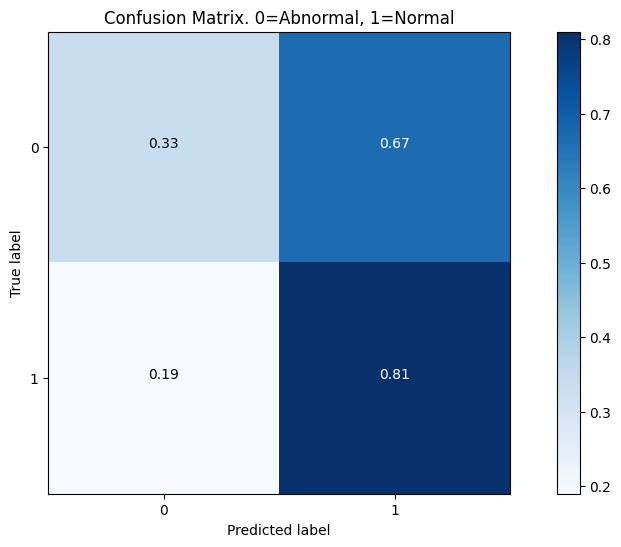

dict_keys(['loss', 'acc', 'val_loss', 'val_acc'])


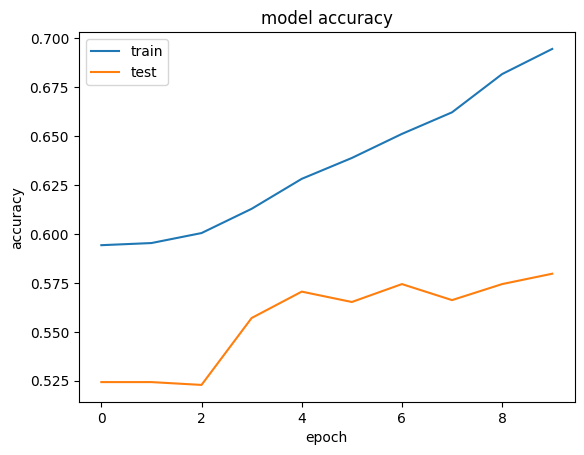

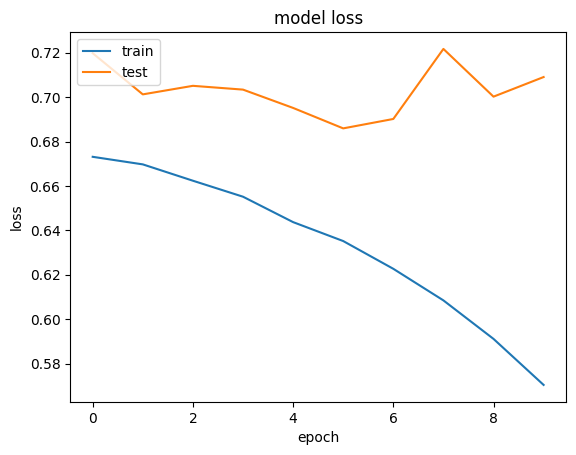

In [ ]:
evaluate_model(y_test,y_pred,history)

# Visualizing filters

In [ ]:
def is_conv_or_pool(layer_name):
  if ("conv" in layer_name or "pool" in layer_name):
    return True
  return False

In [ ]:
layer_names = [layer.name for layer in model.layers]
layer_names = [layer.name for layer in model.layers[1:] if is_conv_or_pool(layer.name)]
layer_names

['conv2d',
 'max_pooling2d',
 'conv2d_1',
 'max_pooling2d_1',
 'conv2d_2',
 'max_pooling2d_2',
 'conv2d_3',
 'max_pooling2d_3',
 'conv2d_4',
 'max_pooling2d_4']

In [ ]:
feature_maps = [layer.output for layer in model.layers[1:] if is_conv_or_pool(layer.name)]
feature_map_model = tf.keras.Model(
    inputs = model.input,
    outputs = feature_maps
)

feature_map_model.summary()

Model: "model_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_input (InputLayer  [(None, 200, 200, 3)]    0         
 )                                                               
                                                                 
 rescaling (Rescaling)       (None, 200, 200, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 198, 198, 256)     7168      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 99, 99, 256)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 97, 97, 128)       295040    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 48, 48, 128)      0  

In [ ]:
test_path_1 = "/content/drive/MyDrive/Spring/506-AI/COLAB/Project/MURA/test_maps/XR_ELBOW-patient11326-study1_positive-image2.png"
test_path_2 = "/content/drive/MyDrive/Spring/506-AI/COLAB/Project/MURA/test_maps/XR_ELBOW-patient11345-study1_negative-image1.png"
test_path_3 = "/content/drive/MyDrive/Spring/506-AI/COLAB/Project/MURA/test_maps/XR_FINGER-patient11420-study1_positive-image4.png"
test_path_4 = "/content/drive/MyDrive/Spring/506-AI/COLAB/Project/MURA/test_maps/XR_FOREARM-patient11395-study1_positive-image2.png"
test_path_5 = "/content/drive/MyDrive/Spring/506-AI/COLAB/Project/MURA/test_maps/XR_SHOULDER-patient11579-study1_positive-image2.png"

(1, 200, 200, 3)


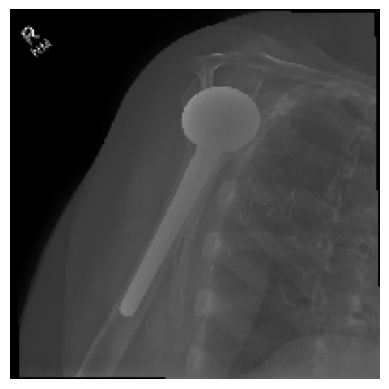

In [ ]:

#test_image= mis[700]
test_image = test_path_5
f_img = load_img(test_image, target_size=(img_height,img_width) , color_mode="rgb")

# view as a tensor image
img_tensor = img_to_array(f_img)
img_tensor = np.expand_dims(img_tensor, axis=0)

# Follow the Original Model Preprocessing

img_tensor /= 255.
# Check tensor shape
print(img_tensor.shape)

plt.imshow(img_tensor[0])
plt.axis('off')
plt.show()

In [ ]:
from keras import models
import math 

# Extract model layer outputs
layer_outputs = [layer.output for layer in model.layers[1:] if is_conv_or_pool(layer.name)]
layer_names = [layer.name for layer in model.layers[1:] if is_conv_or_pool(layer.name)]
# Rather than a model with a single output, we are going to make a model to display the feature maps
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_tensor)

first_layer_activation = activations[0]
print(first_layer_activation.shape)

1/1 [==============================] - 0s 112ms/step
(1, 198, 198, 256)


<ipython-input-110-38278ee148d3>:23: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()


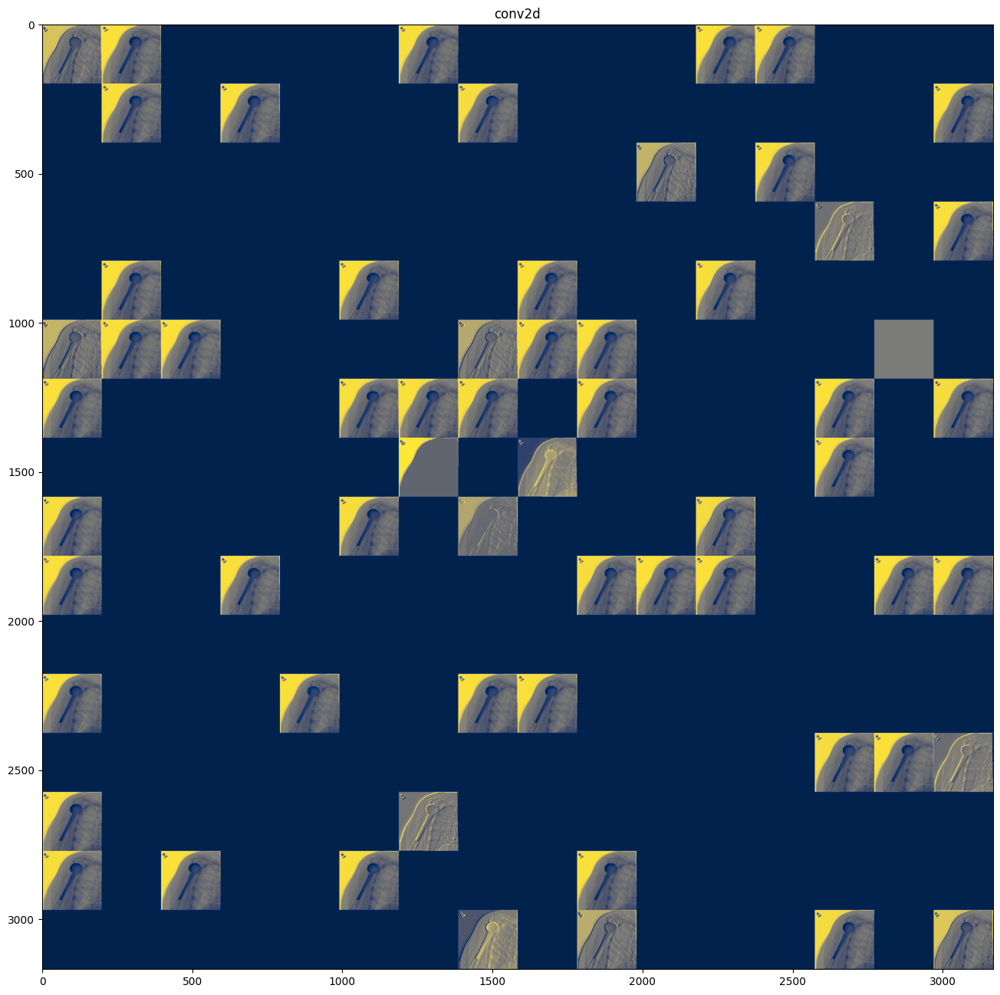

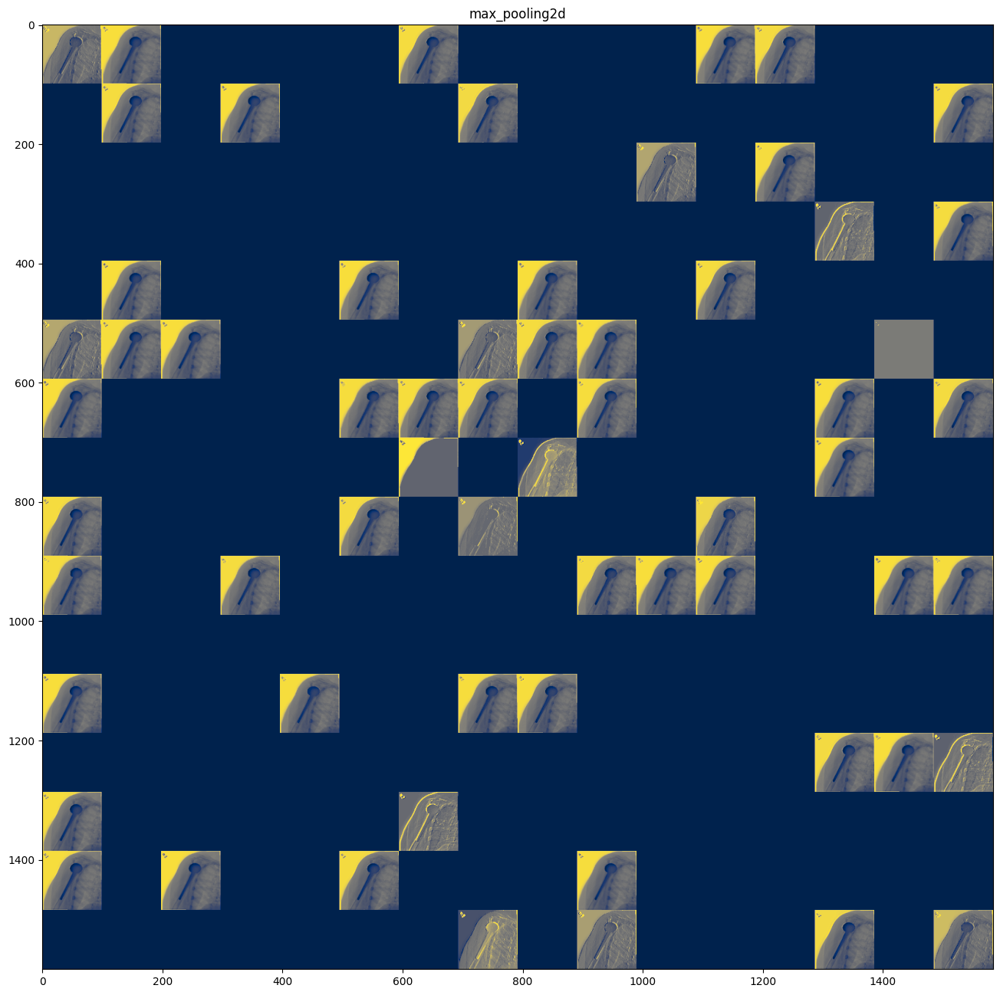

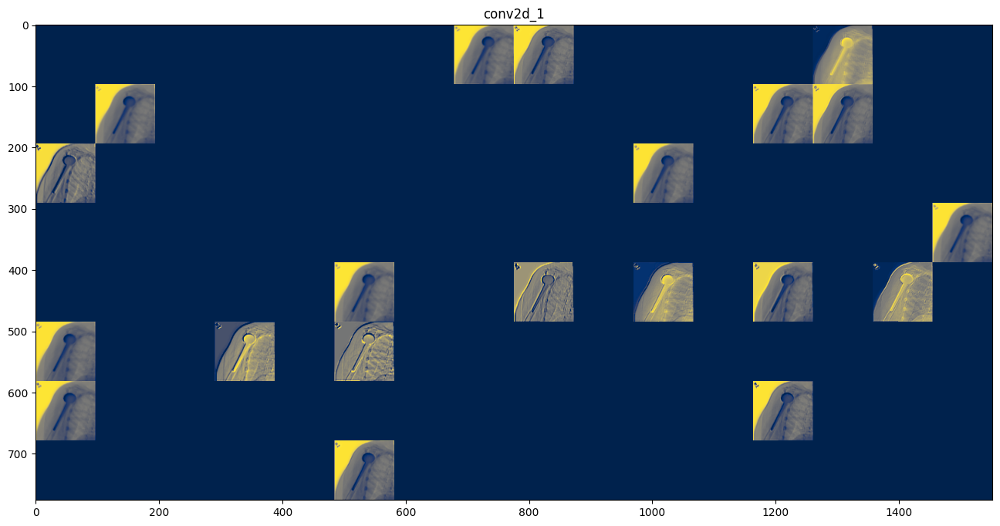

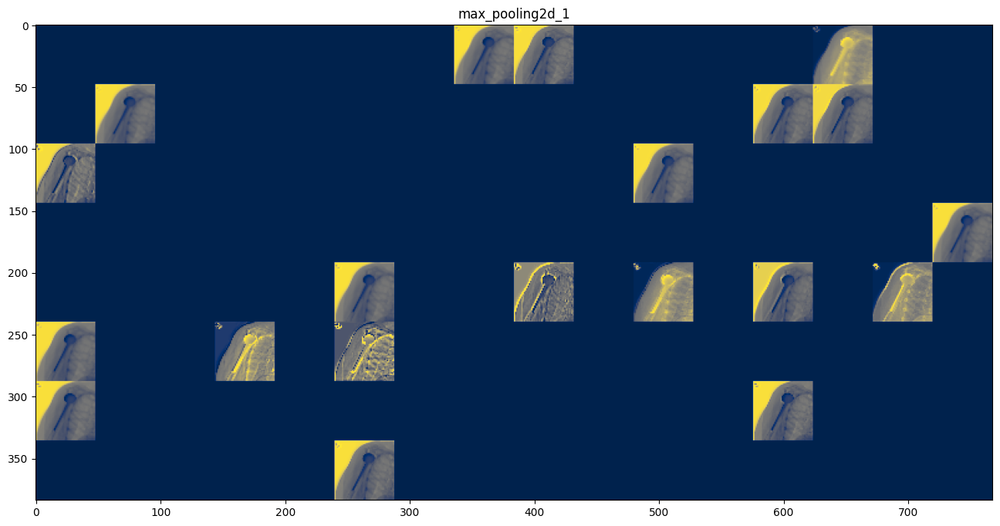

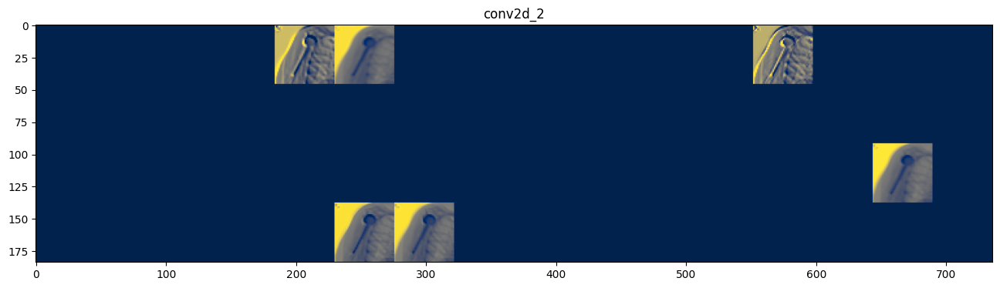

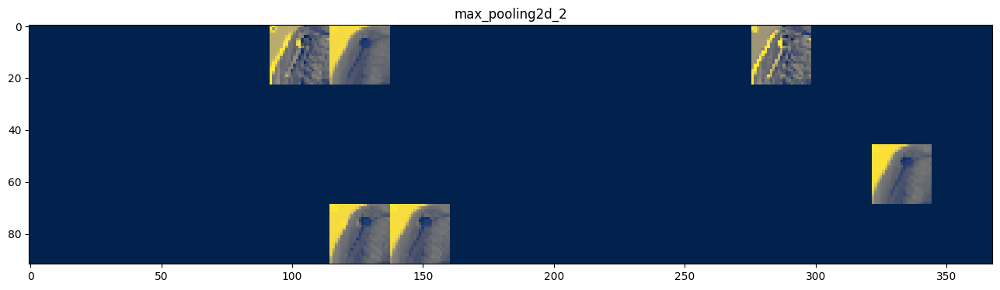

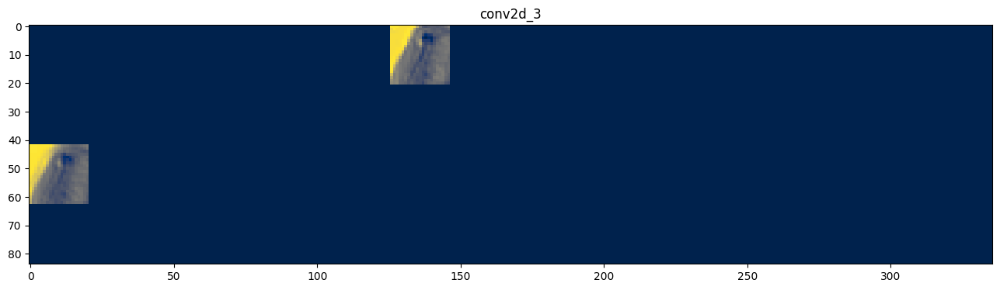

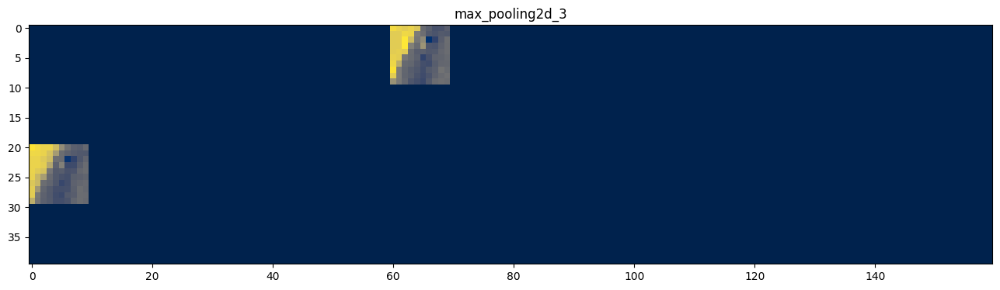

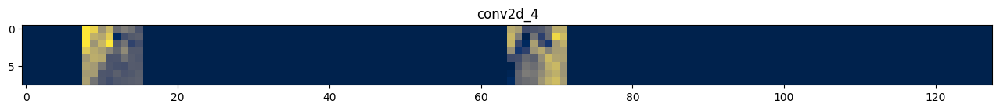

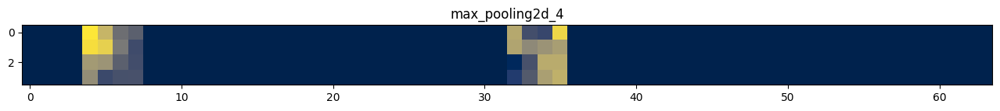

In [ ]:
images_per_row = 16
# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols,  
                             images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize = (scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, 
               aspect = 'auto', 
               cmap = 'cividis')
    
plt.show()

# Class Activation Maps

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 200, 200, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 198, 198, 256)     7168      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 99, 99, 256)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 97, 97, 128)       295040    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 48, 48, 128)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 46, 46, 64)       

In [ ]:
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    #superimposed_img.save(cam_path)
    superimposed_img.show()
    # Display Grad CAM
    #display(Image(cam_path))

1/1 [==============================] - 0s 382ms/step
[[-2.081361]]


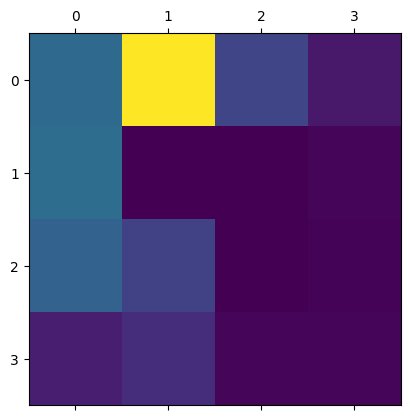

In [ ]:

last_conv_layer_name = "max_pooling2d_4"
#test_image = test_path_4
#test_image = mis[500]

cam_model = model


# Remove last layer's softmax
cam_model.layers[-1].activation = None


f_img = load_img(test_image, target_size=(img_height,img_width) , color_mode=color_mode)

# view as a tensor image
img_tensor = img_to_array(f_img)
img_tensor = np.expand_dims(img_tensor, axis=0)

# Follow the Original Model Preprocessing


# Check tensor shape



# Print what the top predicted class is
preds = cam_model.predict(img_tensor)
print(preds)
# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_tensor, cam_model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

<ipython-input-112-9e73e174d3cf>:55: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


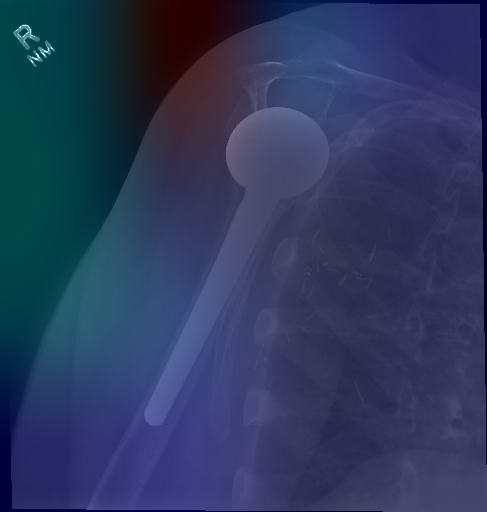

In [ ]:
save_and_display_gradcam(test_image, heatmap)

# Function to print and evaluate images


In [ ]:
def print_eval_img(path_to_image):
  #test_image= mis[700]
  print(path_to_image)
  test_image = path_to_image
  f_img = load_img(test_image, target_size=(img_height,img_width) , color_mode="rgb")

  # view as a tensor image
  img_tensor = img_to_array(f_img)
  img_tensor = np.expand_dims(img_tensor, axis=0)

  # Follow the Original Model Preprocessing

  img_tensor /= 255.
  # Check tensor shape
  print(img_tensor.shape)

  plt.imshow(img_tensor[0])
  plt.axis('off')
  plt.show()

  layer_outputs = [layer.output for layer in model.layers[1:] if is_conv_or_pool(layer.name)]
  layer_names = [layer.name for layer in model.layers[1:] if is_conv_or_pool(layer.name)]
  # Rather than a model with a single output, we are going to make a model to display the feature maps
  activation_model = models.Model(inputs=model.input, outputs=layer_outputs)
  activations = activation_model.predict(img_tensor)

  first_layer_activation = activations[0]

  images_per_row = 16
# Now let's display our feature maps
  for layer_name, layer_activation in zip(layer_names, activations):
      # This is the number of features in the feature map
      n_features = layer_activation.shape[-1]

      # The feature map has shape (1, size, size, n_features)
      size = layer_activation.shape[1]

      # We will tile the activation channels in this matrix
      n_cols = n_features // images_per_row
      display_grid = np.zeros((size * n_cols,  
                              images_per_row * size))

      # We'll tile each filter into this big horizontal grid
      for col in range(n_cols):
          for row in range(images_per_row):
              channel_image = layer_activation[0,
                                              :, :,
                                              col * images_per_row + row]
              # Post-process the feature to make it visually palatable
              channel_image -= channel_image.mean()
              channel_image /= channel_image.std()
              channel_image *= 64
              channel_image += 128
              channel_image = np.clip(channel_image, 0, 255).astype('uint8')
              display_grid[col * size : (col + 1) * size,
                          row * size : (row + 1) * size] = channel_image

      # Display the grid
      scale = 1. / size
      plt.figure(figsize = (scale * display_grid.shape[1],
                          scale * display_grid.shape[0]))
      plt.title(layer_name)
      plt.grid(False)
      plt.imshow(display_grid, 
                aspect = 'auto', 
                cmap = 'cividis')
      
  plt.show()


  last_conv_layer_name = "max_pooling2d_4"
#test_image = test_path_4
#test_image = mis[500]

  cam_model = model


  # Remove last layer's softmax
  cam_model.layers[-1].activation = None


  f_img = load_img(test_image, target_size=(img_height,img_width) , color_mode=color_mode)

  # view as a tensor image
  img_tensor = img_to_array(f_img)
  img_tensor = np.expand_dims(img_tensor, axis=0)

  # Follow the Original Model Preprocessing


  # Check tensor shape



  # Print what the top predicted class is
  preds = cam_model.predict(img_tensor)
  print(preds)
  # Generate class activation heatmap
  heatmap = make_gradcam_heatmap(img_tensor, cam_model, last_conv_layer_name)

  # Display heatmap
  plt.matshow(heatmap)
  plt.show()
  save_and_display_gradcam(test_image, heatmap)

/content/drive/MyDrive/Spring/506-AI/COLAB/Project/MURA/test_maps/XR_SHOULDER-patient11579-study1_positive-image2.png
(1, 200, 200, 3)


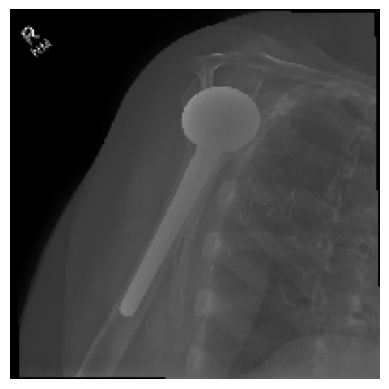

1/1 [==============================] - 0s 147ms/step


<ipython-input-115-0a2650c34dbc>:51: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()


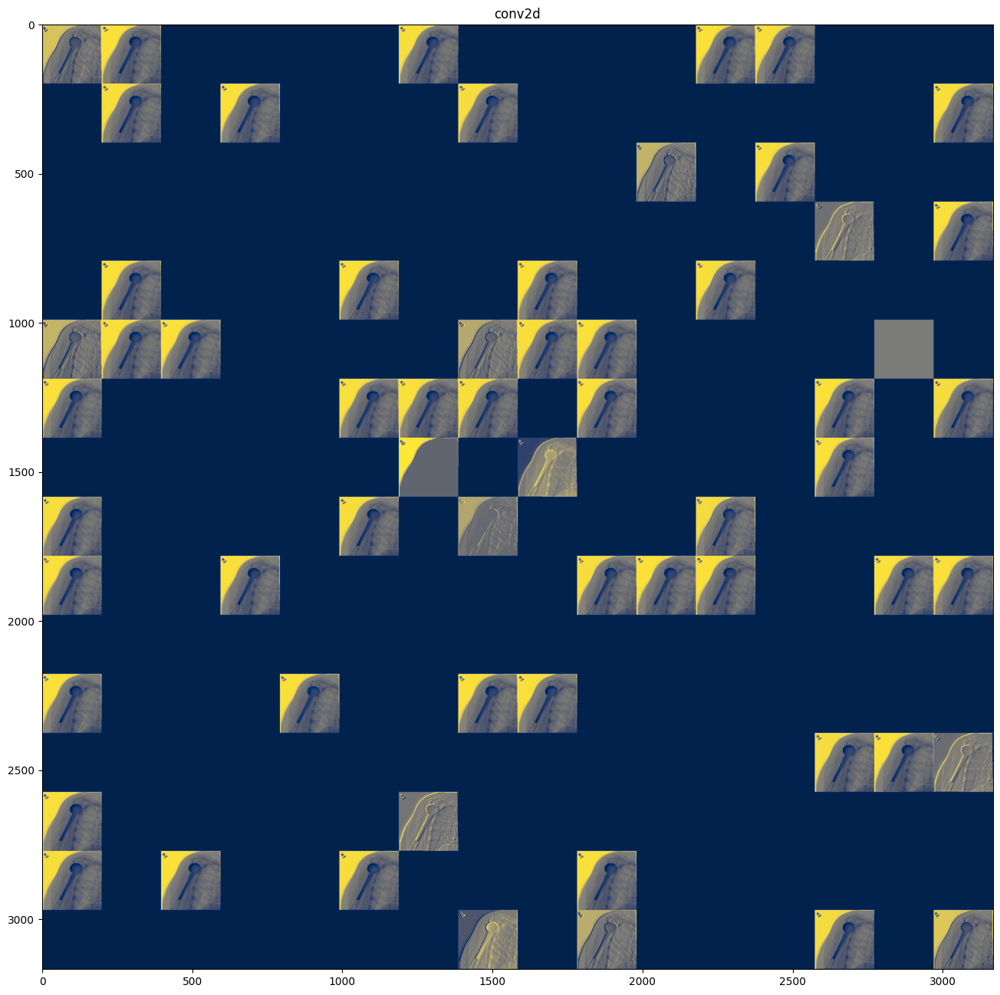

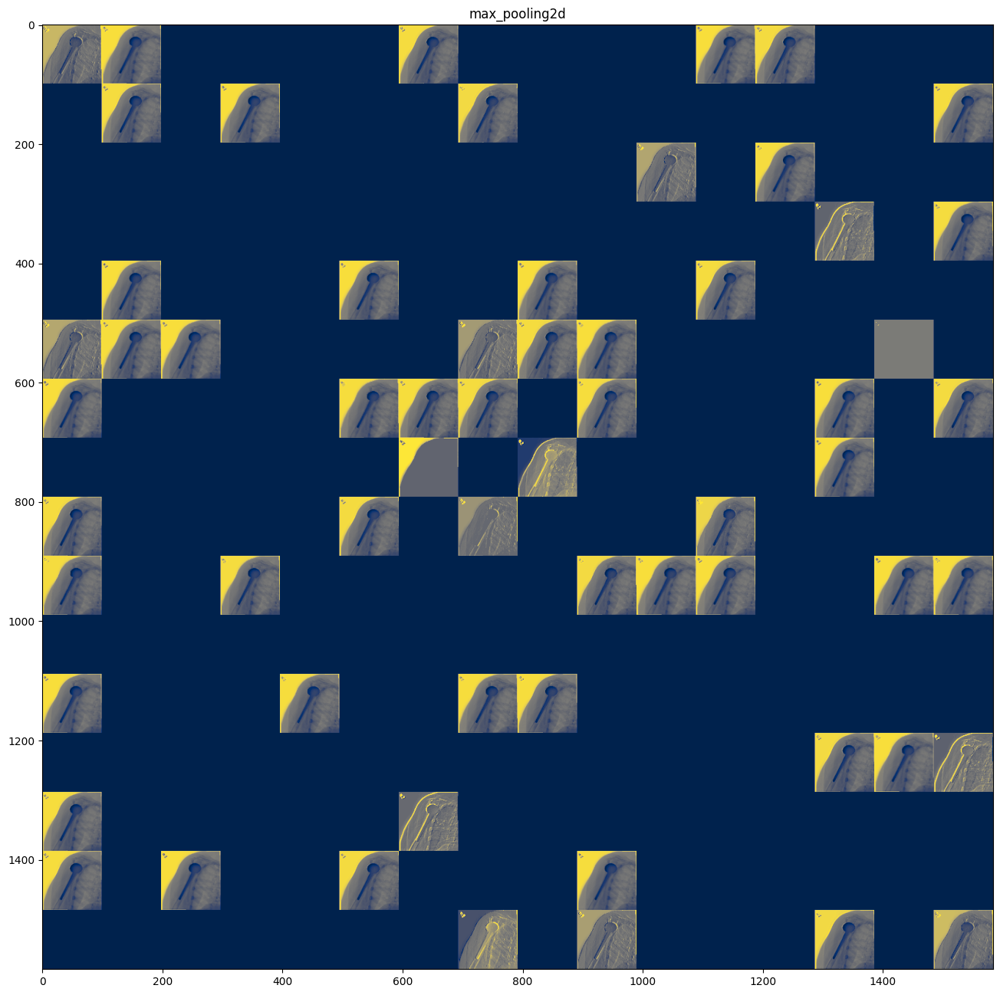

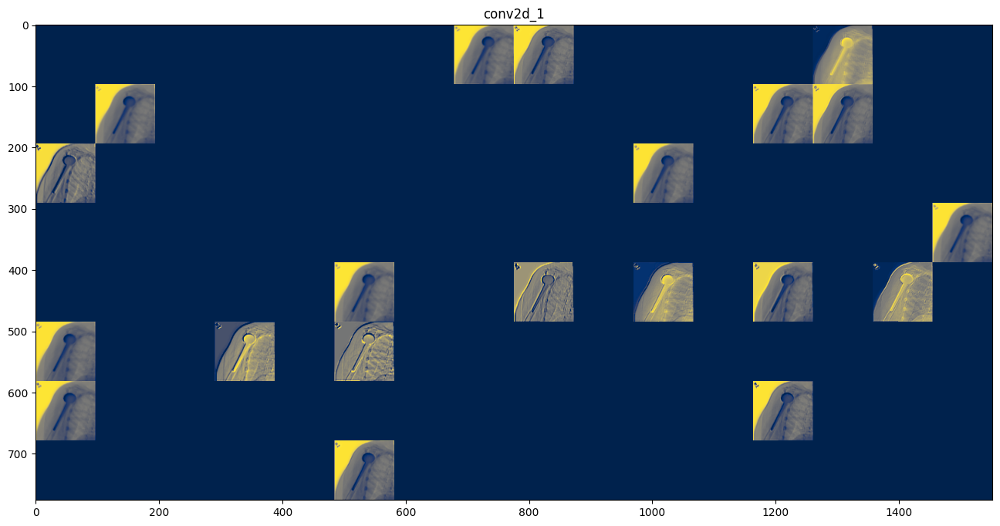

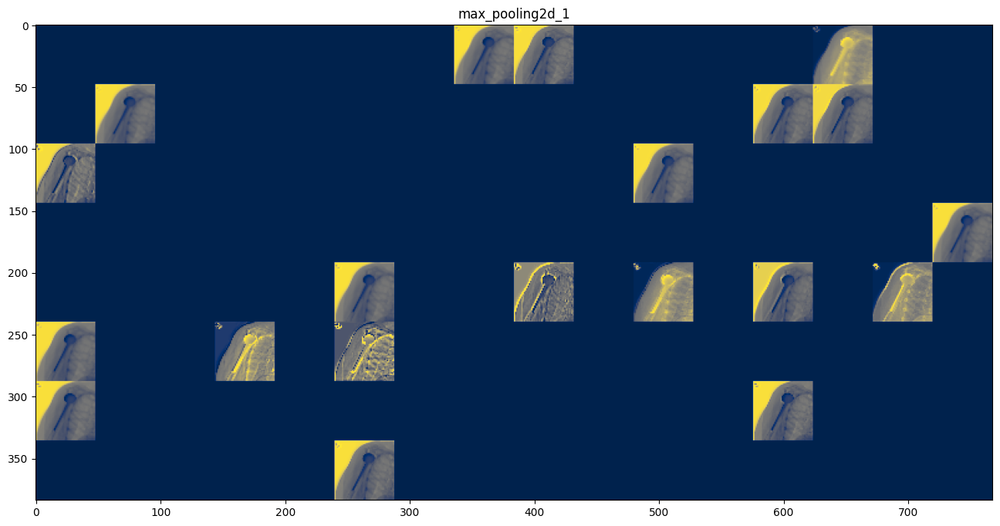

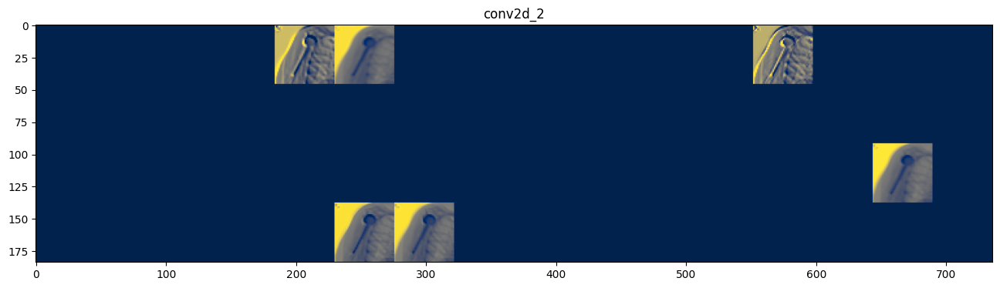

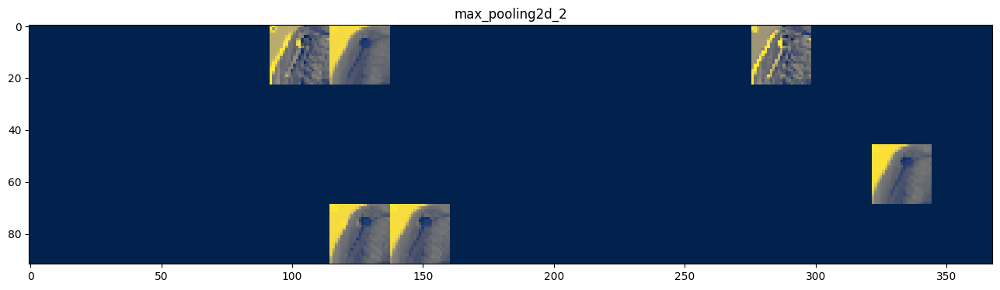

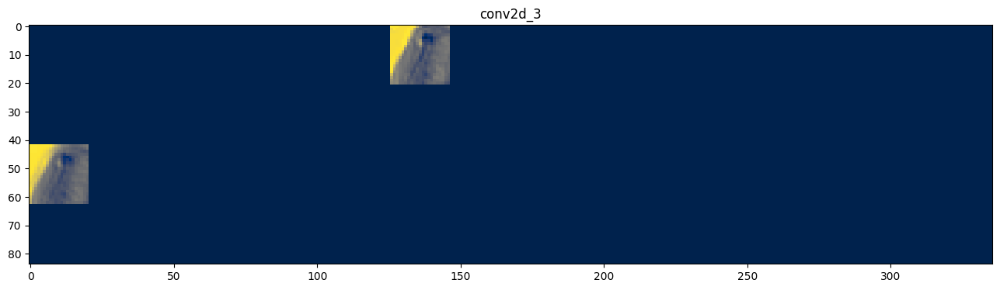

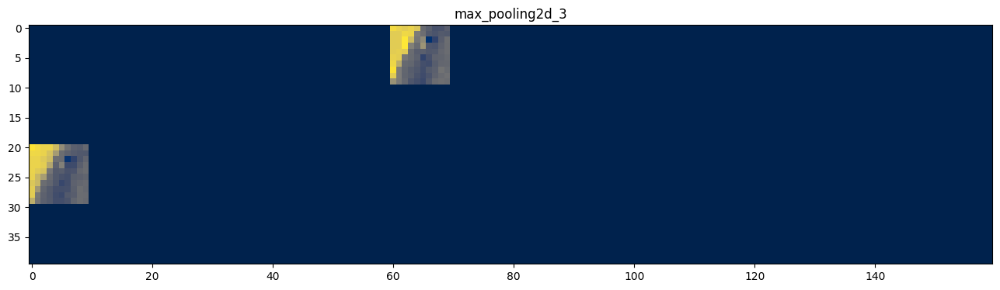

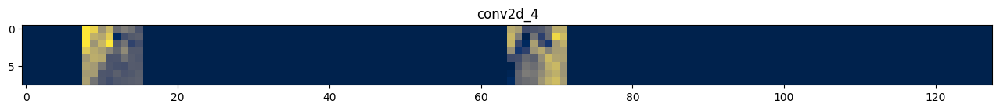

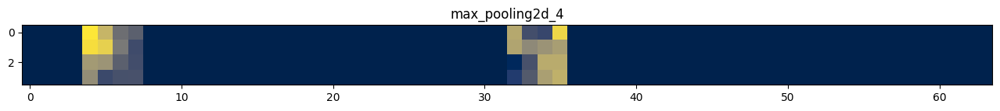

1/1 [==============================] - 0s 29ms/step
[[-2.081361]]


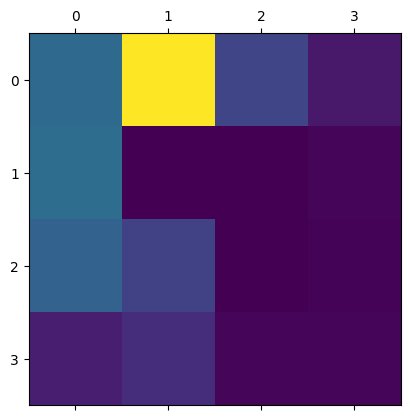

<ipython-input-112-9e73e174d3cf>:55: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


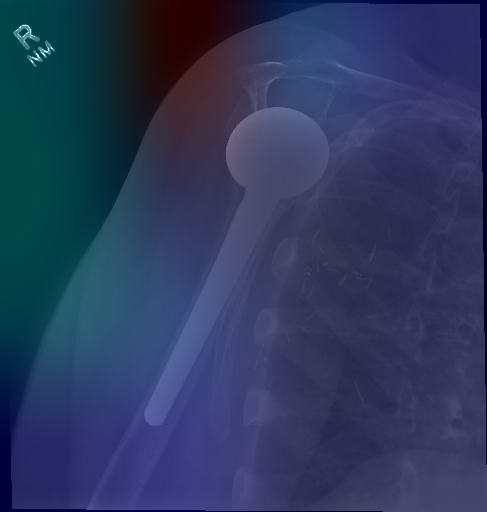

In [ ]:
print_eval_img(test_path_5)

/content/valid_dir_temp/normal/XR_HUMERUS-patient11396-study1_negative-image1.png
(1, 200, 200, 3)


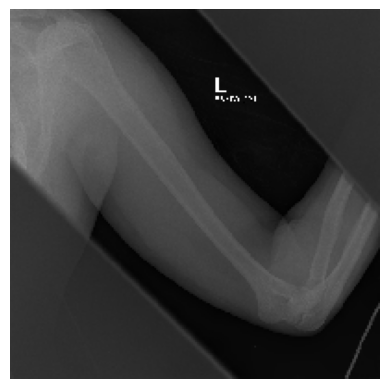

1/1 [==============================] - 0s 163ms/step


<ipython-input-115-0a2650c34dbc>:51: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()


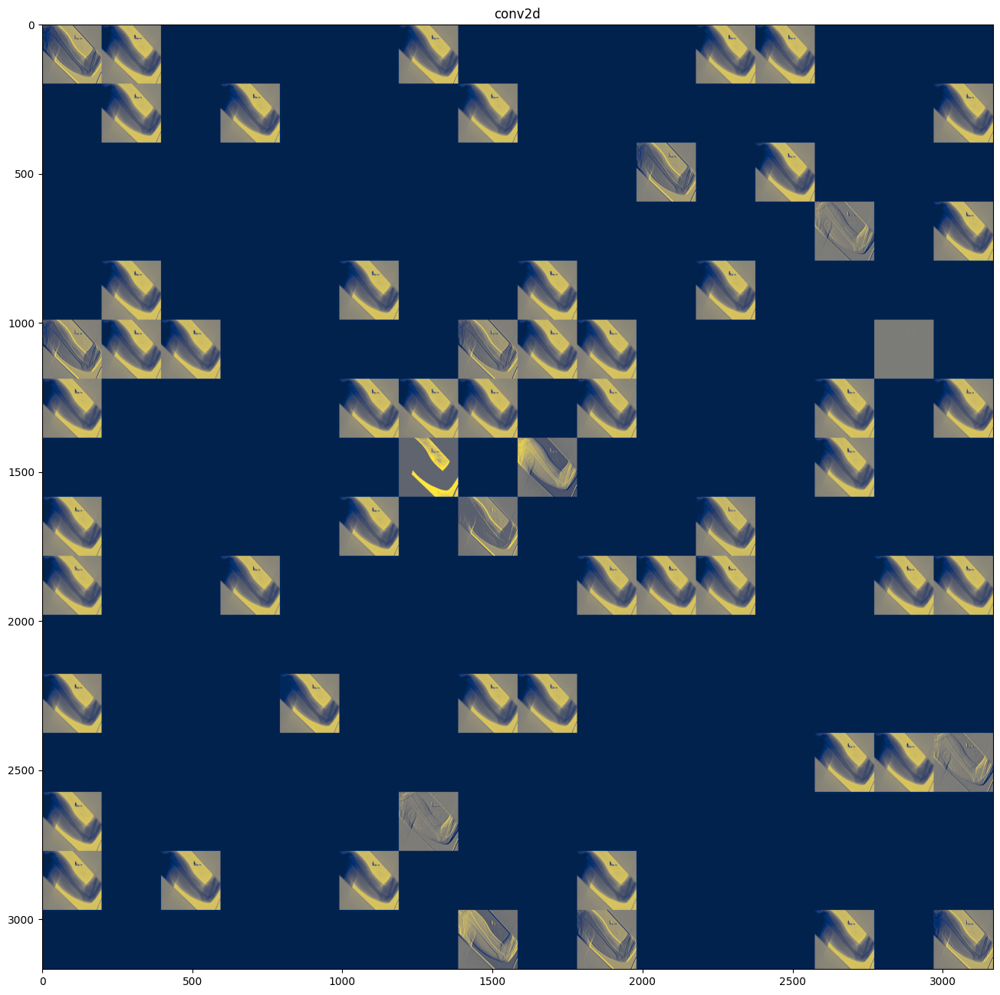

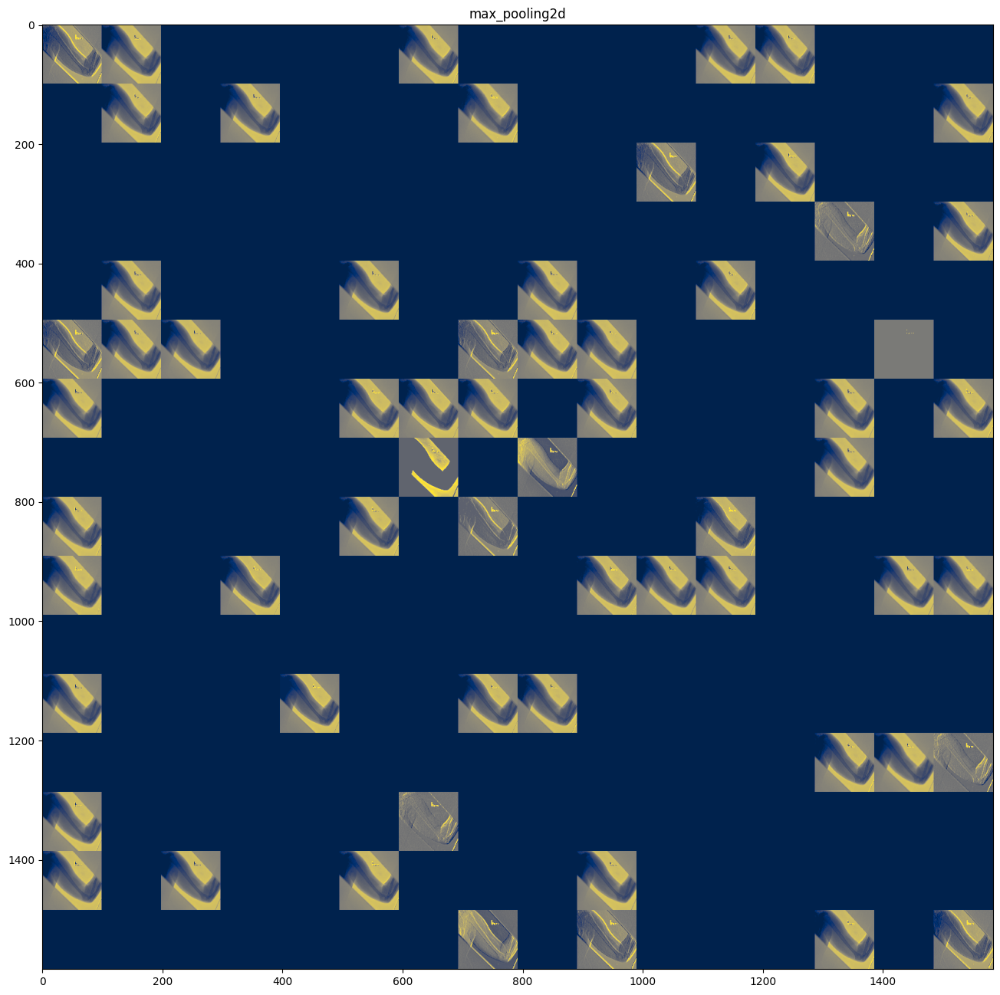

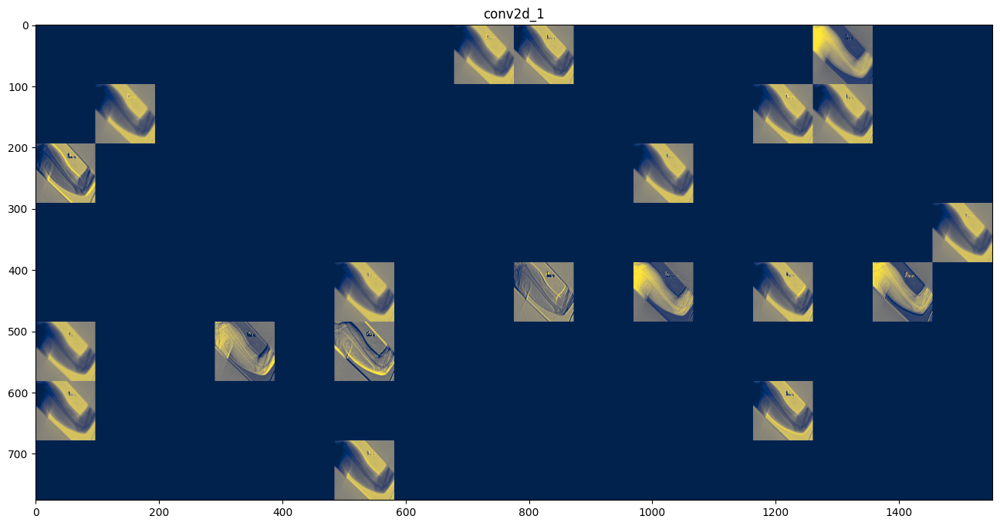

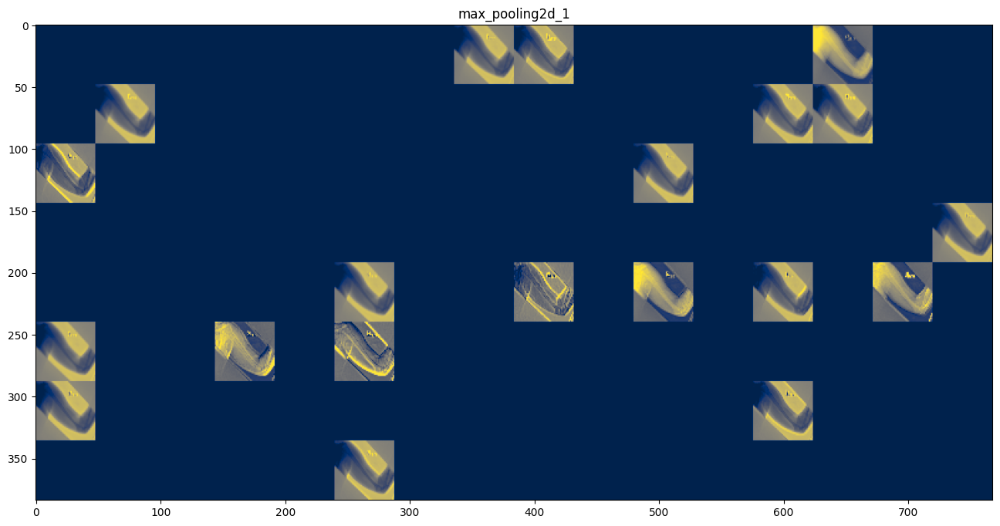

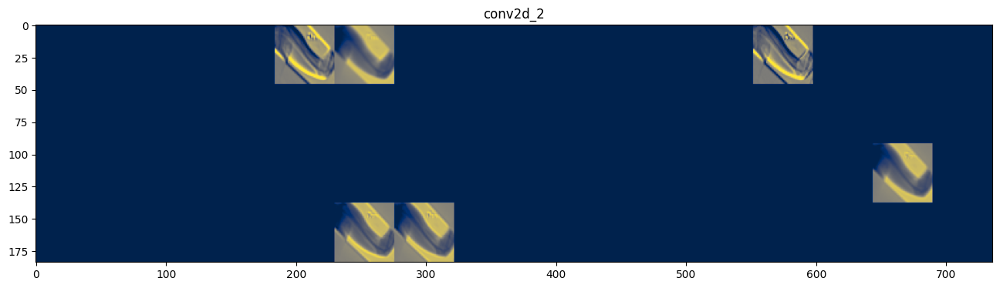

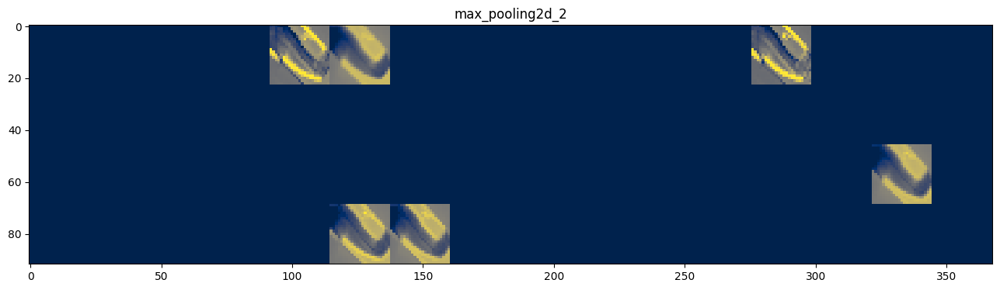

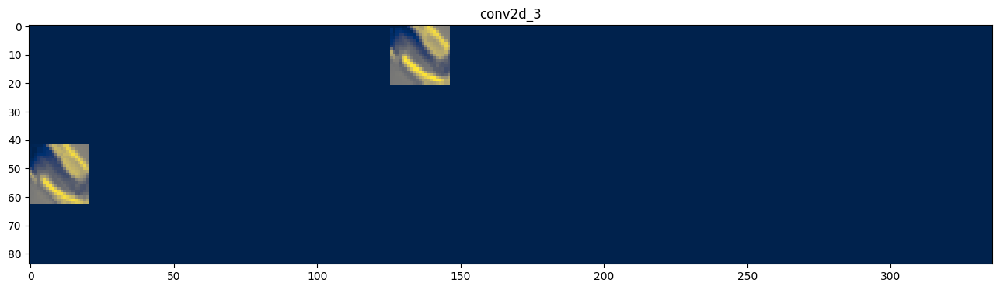

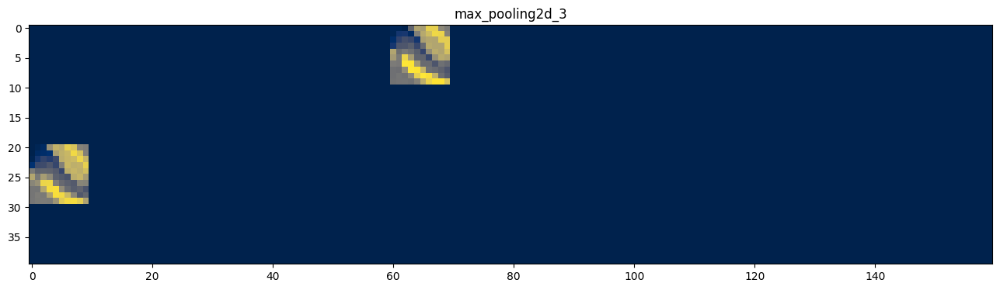

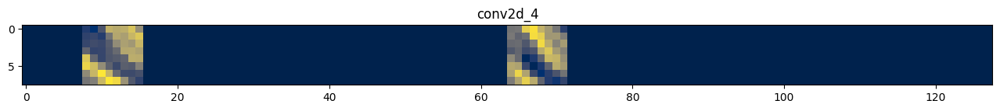

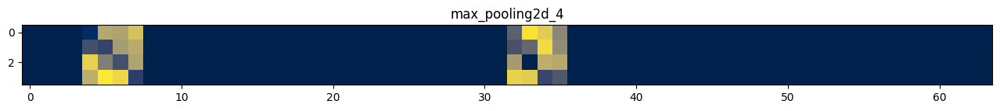

1/1 [==============================] - 0s 28ms/step
[[2.3456004]]


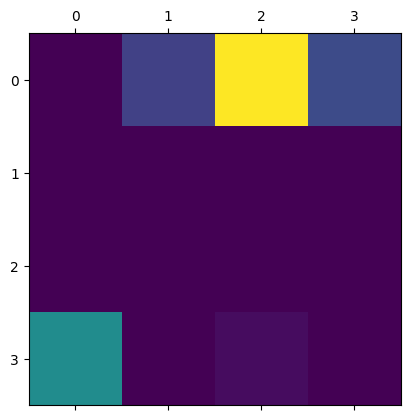

<ipython-input-112-9e73e174d3cf>:55: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


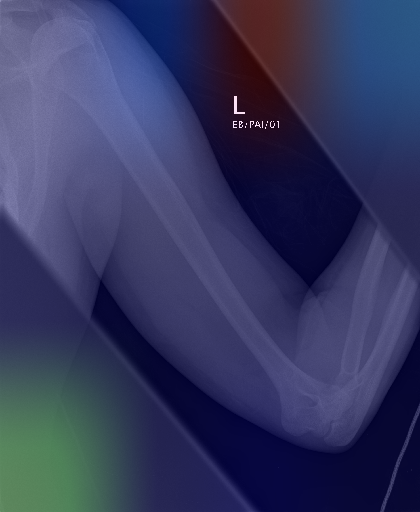

In [ ]:
print_eval_img(mis[100])

/content/drive/MyDrive/Spring/506-AI/COLAB/Project/MURA/test_maps/XR_ELBOW-patient11326-study1_positive-image2.png
(1, 200, 200, 3)


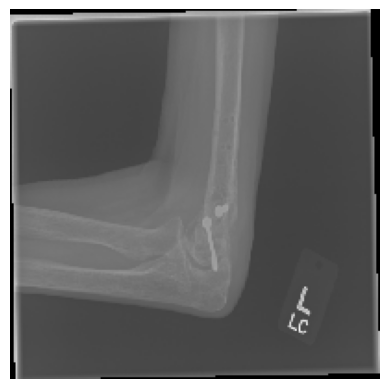

1/1 [==============================] - 0s 200ms/step


<ipython-input-67-0a2650c34dbc>:51: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()


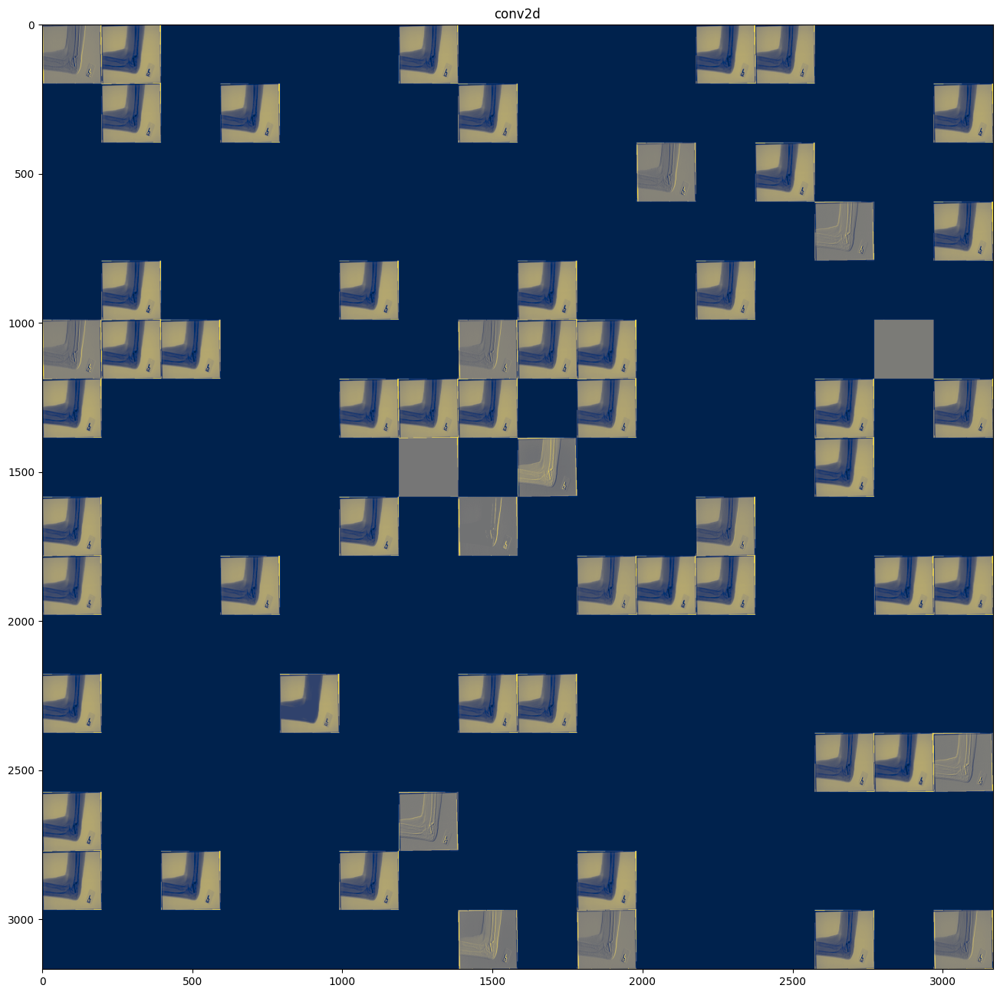

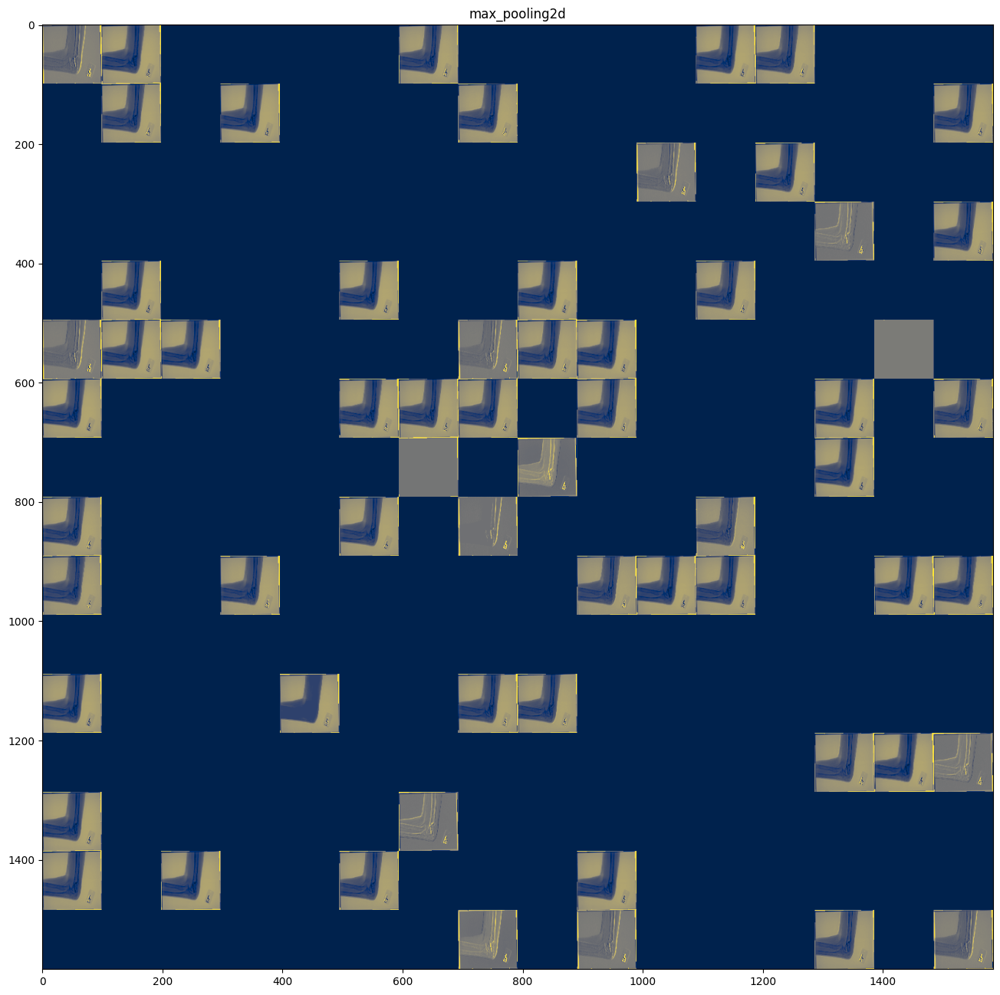

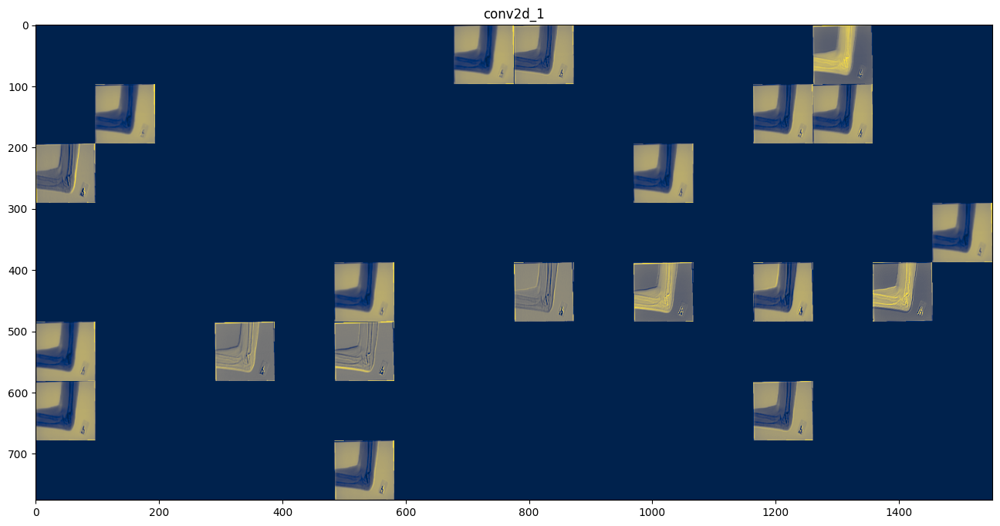

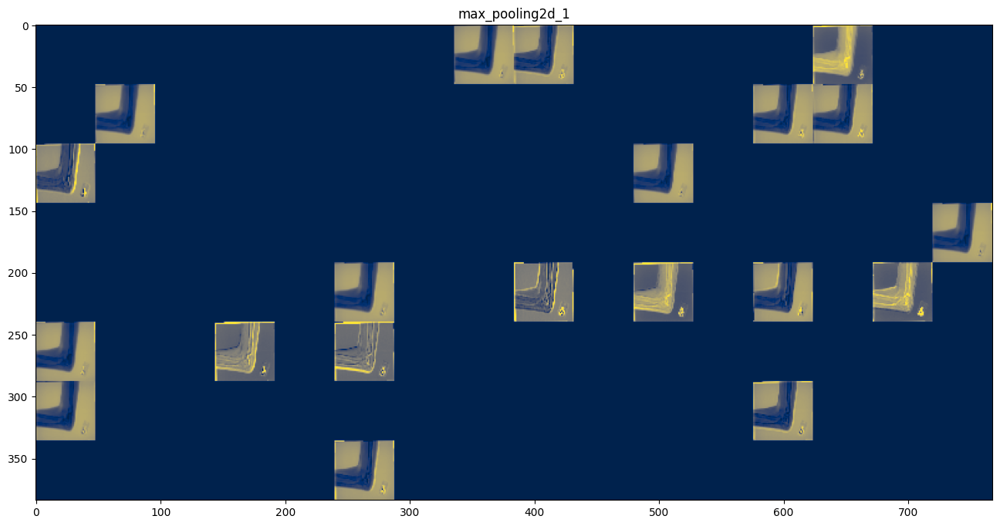

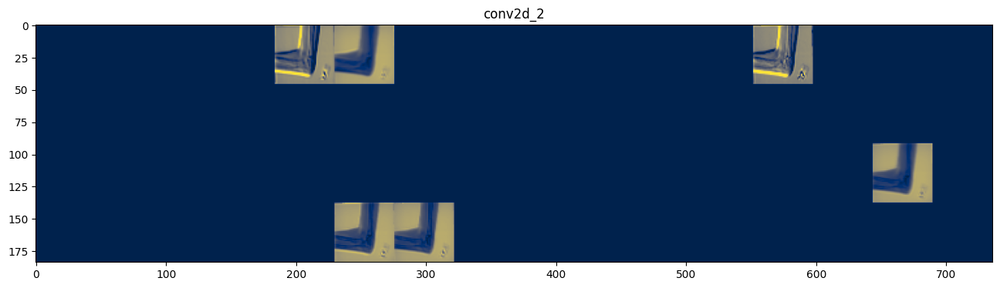

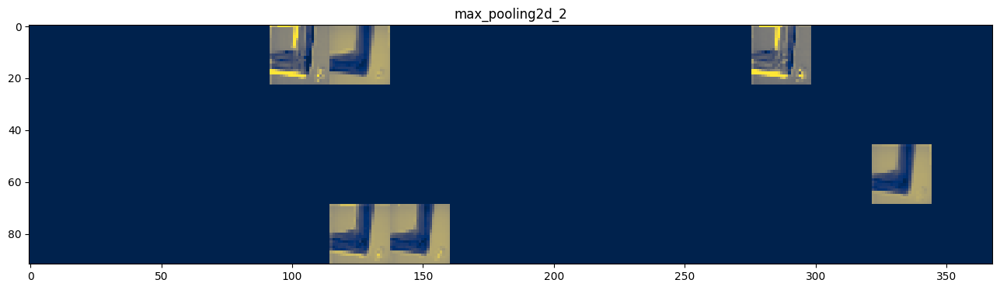

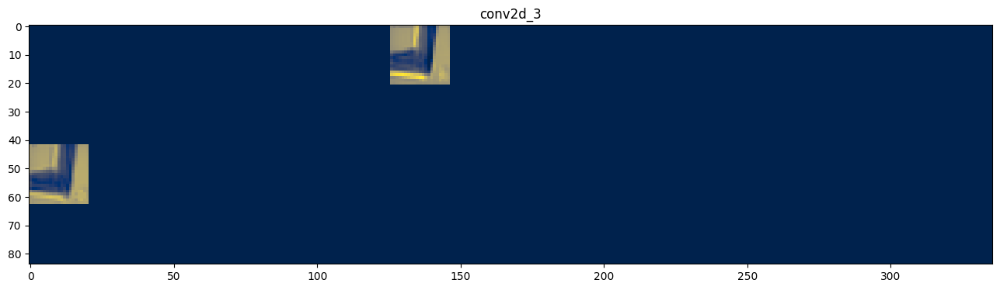

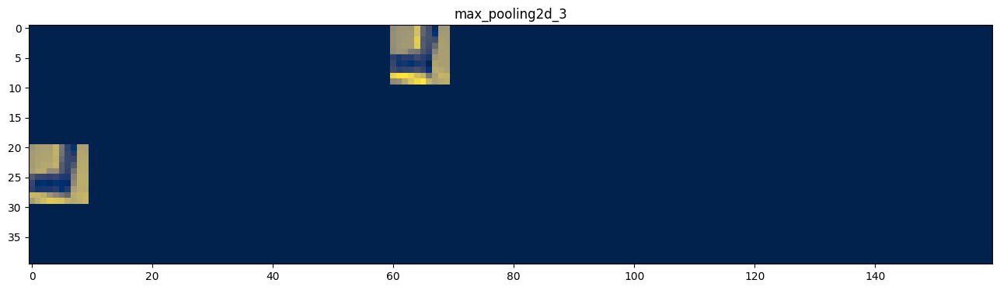

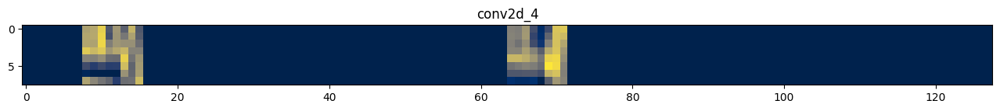

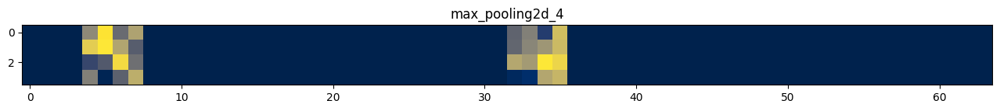

1/1 [==============================] - 0s 30ms/step
[[0.5590875]]


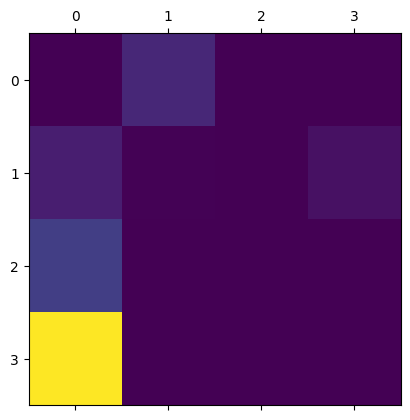

<ipython-input-58-9e73e174d3cf>:55: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


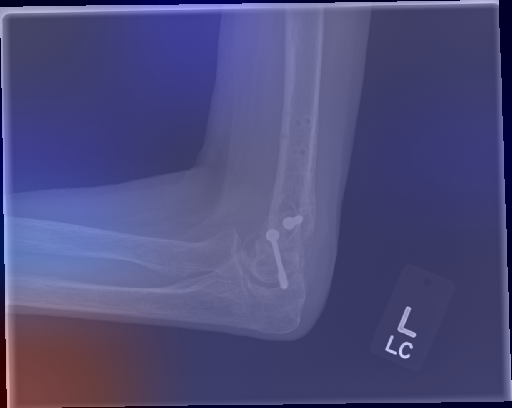

In [ ]:
print_eval_img(test_path_1)

/content/valid_dir_temp/normal/XR_ELBOW-patient11222-study1_negative-image1.png
(1, 200, 200, 3)


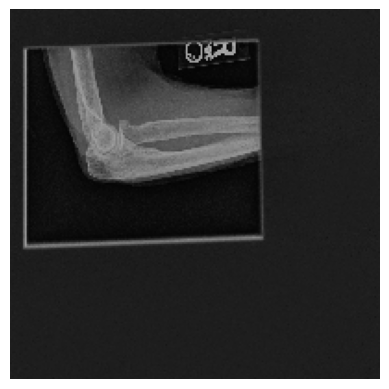

1/1 [==============================] - 0s 132ms/step


<ipython-input-67-0a2650c34dbc>:51: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()


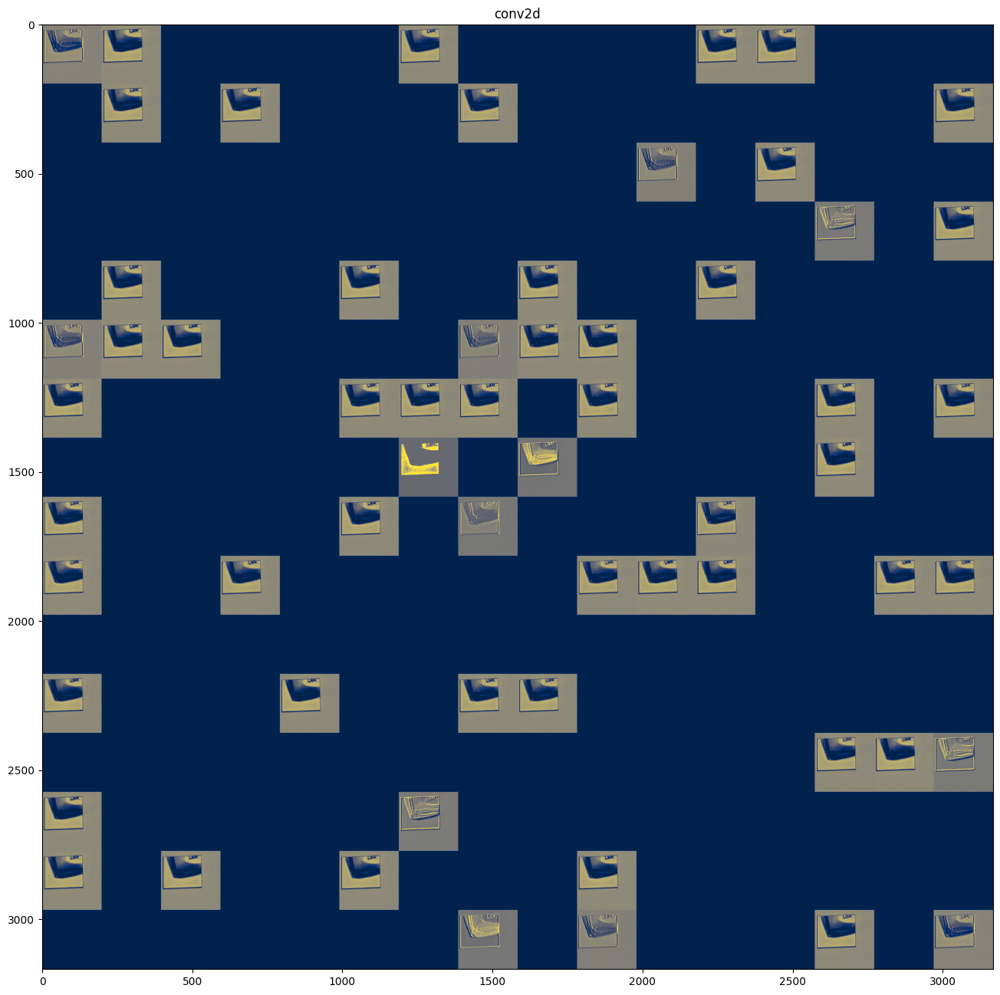

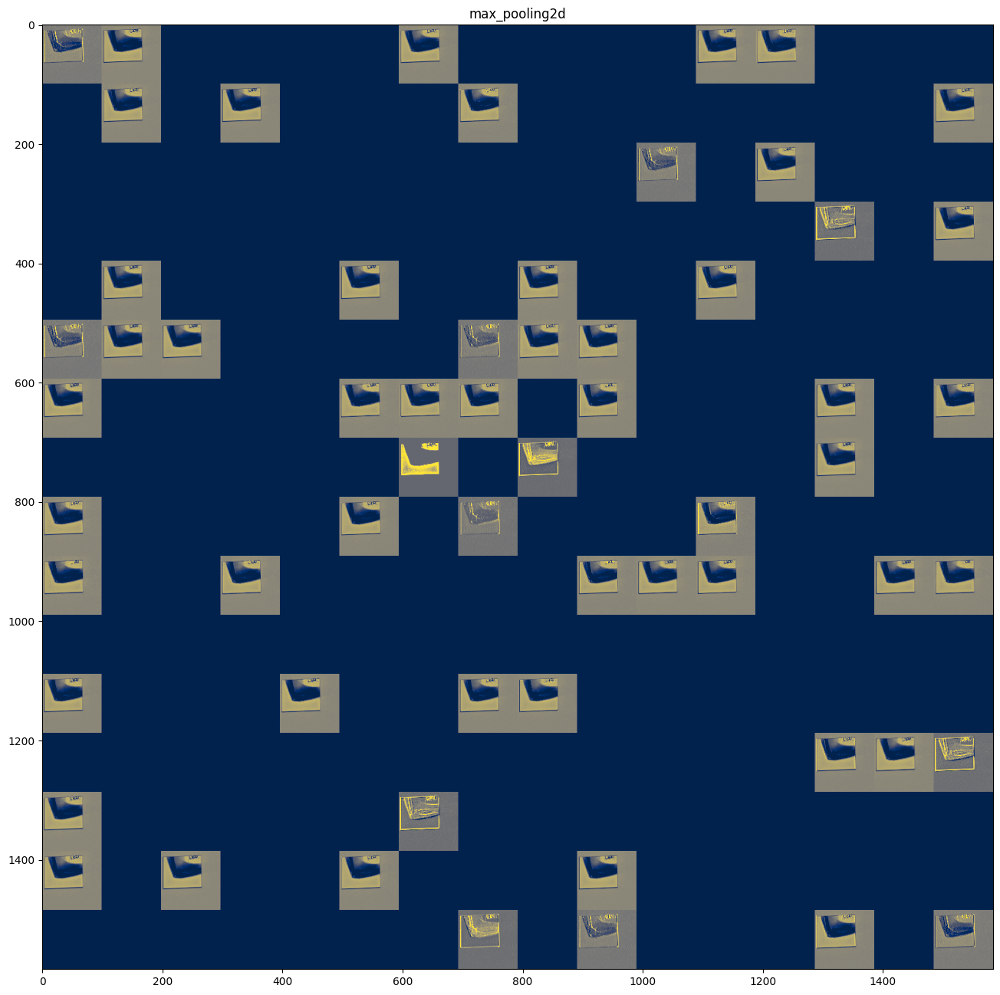

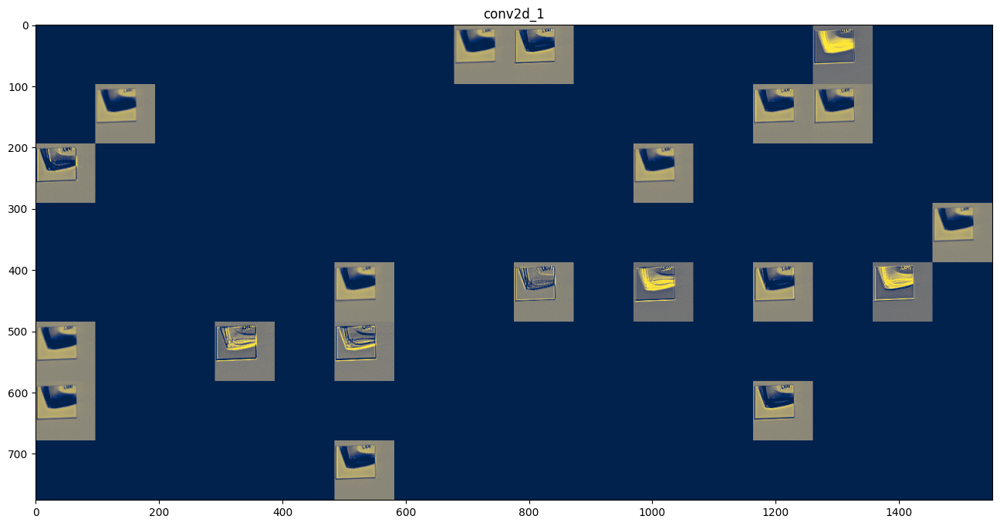

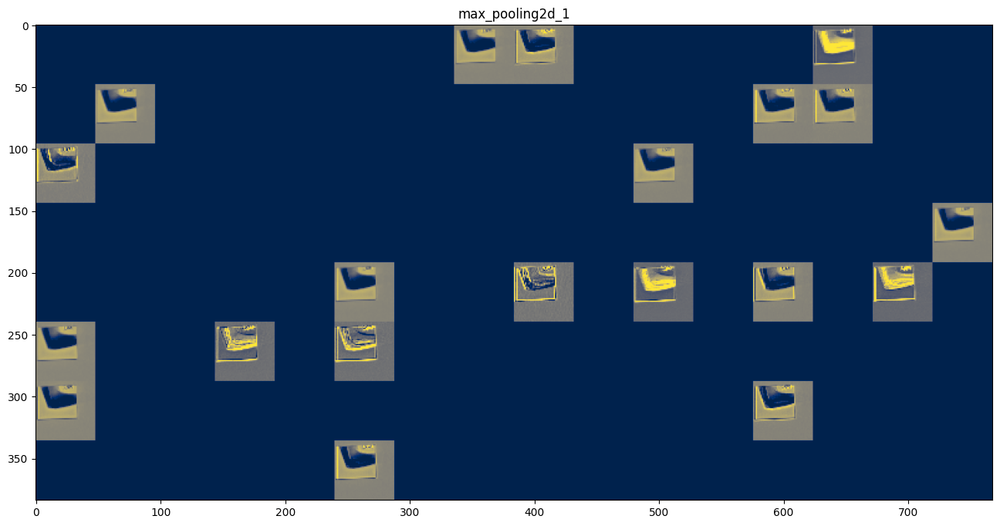

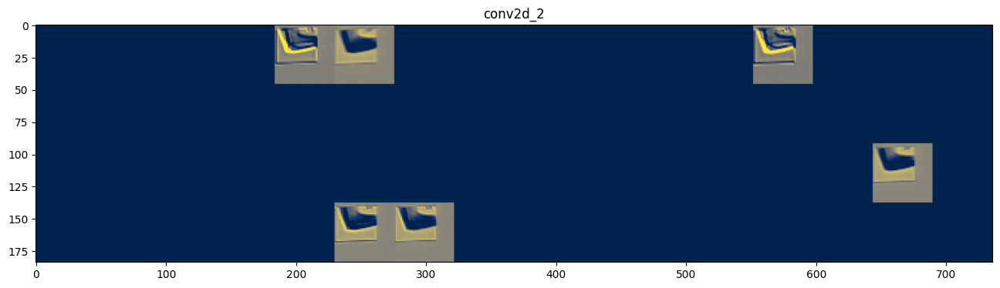

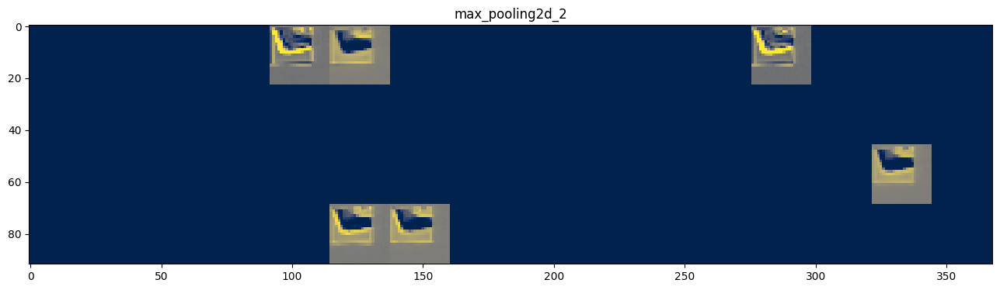

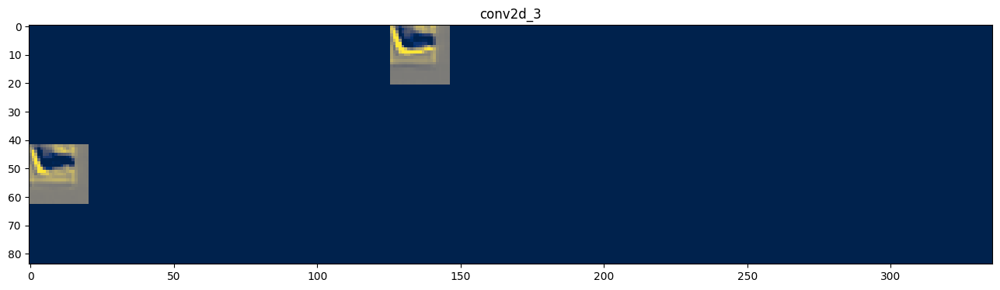

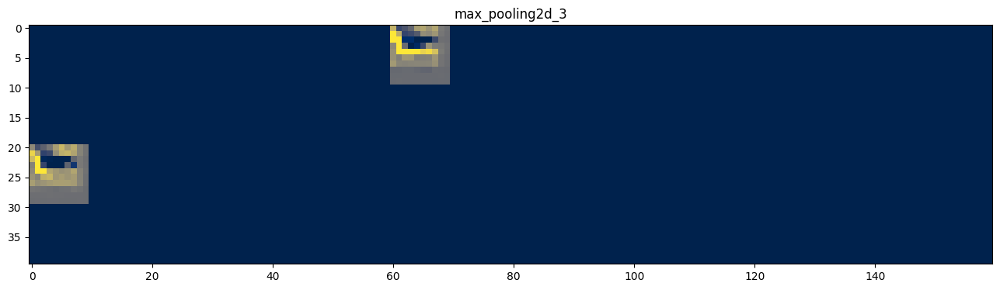

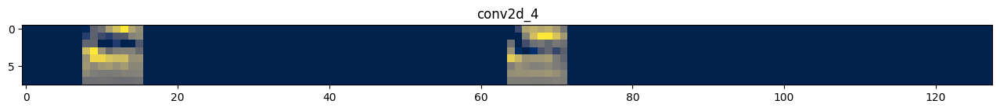

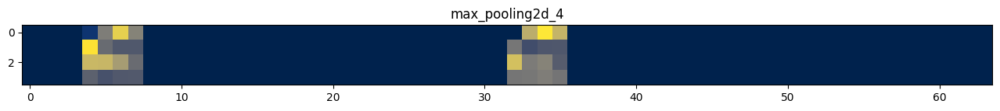

1/1 [==============================] - 0s 37ms/step
[[0.8986591]]


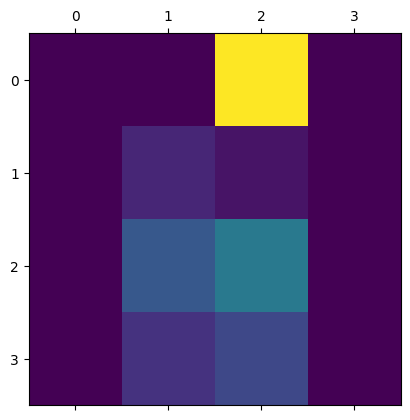

<ipython-input-58-9e73e174d3cf>:55: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


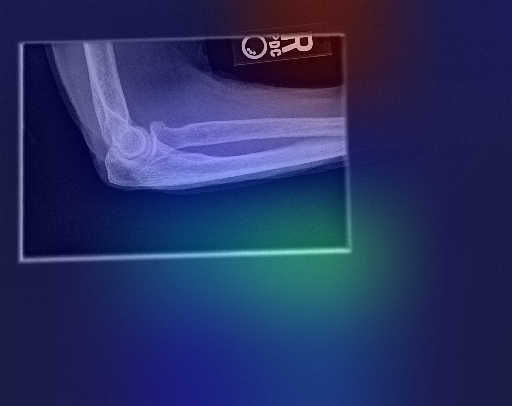

In [ ]:
print_eval_img(non_mis[140])

# Misclassified Images

In [ ]:
mis_paths = {
    "elbow" : [],
    "shoulder" : [],
    "forearm" : [],
    "humerus" : [],
    "finger" : [],
    "hand" : [],
    "wrist" : []
}

for path in mis:
  part = path.split("/")
  part = part[4].split("-")
  part = part[0].split("_")[1]
  mis_paths[part.lower()].append((part.lower() ,path ))
  

In [ ]:
len(mis_paths['elbow']) , len(mis_paths['shoulder']) ,len(mis_paths['forearm']) ,len(mis_paths['humerus']) ,len(mis_paths['finger']) , len(mis_paths['hand']) , len(mis_paths['wrist'])

(198, 191, 140, 114, 0, 182, 0)